Universidad Nacional de Colombia


Miguel Angel Ortiz Marin - [miaortizma.github.io](https://miaortizma.github.io)

# 0. About this notebook

This notebook is written with a 'tutorial' style in mind. If you are just reviewing this notebook you can skip the first section (setup) and start reading from the second one. If you are interested in executing this notebook (for colaborating or replicating results) you can read the notes below. For problem description and overview of the methods please see [poster]() and [report]() for details.




## Notes about execution of Notebook

The notebook is written with the help of Google Colaboratory environment. Mounting Google Drive and creating a folder for preprocessing and model checkpoints is heavily recommended. (e.g Creating a folder 'HandWashCheckPoints' in your gdrive root would make this notebook work almost out of the box, see note below).



- You can skip running the cells inside the second section (DataSet exploration, though it is recommended to read that section in order to familiarize with the dataset).
- After you have setup a folder to store checkpoints and resized videos you can start running from the cells in the fourth section.

The expected folder layout (for minimal modifications of code) is the following :

```
Raw Dataset folder (downloaded from kaggle)
/content/HandWashDataset/HandWashDataset
/content/HandWashDataset/HandWashDataset/Step_1
/content/HandWashDataset/HandWashDataset/Step_2_Left
...

Google Drive root folder
/gdrive/HandWashCheckPoints

Resized Videos (with ffmpeg)

256x256
/gdrive/HandWashCheckPoints/HandWashResized
/gdrive/HandWashCheckPoints/HandWashResized/Step_1
/gdrive/HandWashCheckPoints/HandWashResized/Step_2_Left
...

172x128 (ffmpeg doesn't easily allow for 171, may try later)
/gdrive/HandWashCheckPoints/HandWashResized128x171Step_1
/gdrive/HandWashCheckPoints/HandWashResized128x171/Step_1
/gdrive/HandWashCheckPoints/HandWashResized128x171/Step_2_Left
...

Checkpoints for models (e.g R(2+1)D)
/gdrive/HandWashCheckPoints/r2plu1d_18
/gdrive/HandWashCheckPoints/r2plu1d_18/best (best results in val)
/gdrive/HandWashCheckPoints/r2plu1d_18/latest (last epoch)
```

Making colab not stop (tried it and didn't work):
1. inspect console
1. put in console
```
function ClickConnect(){
    console.log('Working');
    document.querySelector("colab-connect-button").shadowRoot.getElementById('connect').click();
}
setInterval(ClickConnect,60000)
```

# 1. Setup


## Installing Dependencies

In [ ]:
pip install decord av

     |████████████████████████████████| 11.8MB 260kB/s 
     |████████████████████████████████| 36.9MB 88kB/s 


## Mounting Google Drive

In [ ]:
from google.colab import drive

drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


## Downloading Hand-wash dataset

realtimear/hand-wash-dataset

In [ ]:
!mkdir /root/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
%%writefile /root/.kaggle/kaggle.json
{"username":"miaortizma","key":"fb4f9ddb10203c1407782f6411cca37a"}

Writing /root/.kaggle/kaggle.json


In [ ]:
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download realtimear/hand-wash-dataset
!kaggle datasets metadata realtimear/hand-wash-dataset
!unzip hand-wash-dataset.zip

100% 1.21G/1.21G [00:14<00:00, 145MB/s]
100% 1.21G/1.21G [00:14<00:00, 89.9MB/s]
Downloaded metadata to /content/dataset-metadata.json
Archive:  hand-wash-dataset.zip
  inflating: HandWashDataset/HandWashDataset/HandwashList.txt  
  inflating: HandWashDataset/HandWashDataset/Sample-HandWashDataset.png  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_001_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_002_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_003_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_004_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_005_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_006_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_007_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/HandWash_008_A_01_G01.mp4  
  inflating: HandWashDataset/HandWashDataset/Step_1/Han

## Using FFmpeg to resize videos

Go grab a coffe for this.

In [ ]:
from pathlib import Path
import os 
import time

DIR = Path('/content/HandWashDataset/HandWashDataset/')
GDRIVE_DIR = Path('/gdrive/My Drive/HandWashCheckpoints')
RESIZED_DIR = GDRIVE_DIR / 'HandWashResized128x171'
RESIZED_DIR.mkdir(exist_ok=True)

steps_categories = ['Step_1', 'Step_2_Left', 'Step_2_Right', 'Step_3', 'Step_4_Left', 'Step_4_Right', 'Step_5_Left', 'Step_5_Right', 'Step_6_Left', 'Step_6_Right', 'Step_7_Left', 'Step_7_Right']

since = time.time()

for category in steps_categories:
  category_videos = os.listdir(DIR / category)
  (RESIZED_DIR / category).mkdir(exist_ok=True)
  for video in sorted(category_videos):
    video_in_path = (DIR / category / video).as_posix()
    video_out_path = (RESIZED_DIR / category / video).as_posix()
    print(video_out_path)
    # scale can also be 256:256
    !ffmpeg -loglevel panic -y -i {video_in_path} -vf scale=172:128 '{video_out_path}'
    

time_elapsed = time.time() - since
print('Complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    

/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_001_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_002_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_003_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_004_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_005_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_006_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_007_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_008_A_01_G01.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_009_A_01_G02.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_010_A_01_G02.mp4
/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/Han

In [ ]:
!ls -alh '/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1'

total 4.9M
-rw------- 1 root root 121K Jul 12 00:58 HandWash_001_A_01_G01.mp4
-rw------- 1 root root 129K Jul 12 00:58 HandWash_002_A_01_G01.mp4
-rw------- 1 root root 181K Jul 12 00:58 HandWash_003_A_01_G01.mp4
-rw------- 1 root root 198K Jul 12 00:58 HandWash_004_A_01_G01.mp4
-rw------- 1 root root 121K Jul 12 00:58 HandWash_005_A_01_G01.mp4
-rw------- 1 root root 208K Jul 12 00:58 HandWash_006_A_01_G01.mp4
-rw------- 1 root root 285K Jul 12 00:58 HandWash_007_A_01_G01.mp4
-rw------- 1 root root 201K Jul 12 00:58 HandWash_008_A_01_G01.mp4
-rw------- 1 root root 109K Jul 12 00:58 HandWash_009_A_01_G02.mp4
-rw------- 1 root root 113K Jul 12 00:58 HandWash_010_A_01_G02.mp4
-rw------- 1 root root 138K Jul 12 00:58 HandWash_011_A_01_G02.mp4
-rw------- 1 root root 103K Jul 12 00:58 HandWash_012_A_01_G03.mp4
-rw------- 1 root root  85K Jul 12 00:58 HandWash_013_A_01_G03.mp4
-rw------- 1 root root 112K Jul 12 00:58 HandWash_014_A_01_G03.mp4
-rw------- 1 root root 135K Jul 12 00:58 HandWash_0

#2. Exploring HandWash Dataset



The objetive of this section is to get to know the dataset, and also to see some visualization code that could be useful later on.

## Dataset description 

**Taken from [kaggle](https://www.kaggle.com/realtimear/hand-wash-dataset)**

### Context

The link to the GitHub repository that contains an application of this dataset can be found here.
This dataset is currently a sample dataset to represent the entire Hand Wash Dataset. The main intent of this dataset is to be used as a benchmark for action recognition tasks in the future.
Typically, most publicly available action recognition datasets are created for generic actions performed day-today or are actions of people playing a particular sport, for example, UCF-101, UCF Sports, KTH and others.
The actions performed in these datasets involve large movements from frame to frame, and each of these actions is very unique to each other in the sense that they are performed in widely different settings and environments. For example, the action of applying make-up is vastly different from a field hockey penalty, which are both classes in UCF101.
When it comes to identifying each step involved in the hand wash procedure as prescribed by the World Health Organisation, small changes in hand position and changes in the environment need to be taken into account. Since the magnitude of these movements is very small, other action recognition algorithms have a hard time accurately identifying a change from one step to the next.
Additionally, current datasets, are not very representative of a potential real-world application of action recognition, such as fixed camera position, with a mostly static background, and adequate training data. Hence, the importance of creating a new dataset was further highlighted.

### Content

The Hand Wash Dataset consists of 292 individual videos of hand washes (with each hand wash having 12 steps, for a total of 3,504 clips), in different environments to provide as much variance as possible. The variance was important to ensure that the model is robust and can work in more than a few environments. The varied parameters are:

- Illumination
- Background
- Source Camera Position
- Field of view
- Individuals performing the hand wash

This was done because the Hand Wash Dataset intends to simulate the real-world constraints of a potential application of an action recognition solution such as: fixed camera position, real-time feedback, varying illumination, static background and applied to one domain-specific fine-grained action task. The next step was to identify each step involved in the procedure. Hence, the original 7 Steps prescribed by the WHO were further broken down into 12 actions which take into account every possible action that may be performed when a person washes their hands. The action classes are:

- Step 1
- Step 2 Left
- Step 2 Right
- Step 3
- Step 4 Left
- Step 4 Right
- Step 5 Left
- Step 5 Right
- Step 6 Left
- Step 6 Right
- Step 7 Left
- Step 7 Right

## Metadata
Metadata from kaggle dataset-metadata.json

In [ ]:
with open('dataset-metadata.json') as f:
  for l in f:
    print(l)

{

  "subtitle": "Sample (5%) of the video clips of the WHO prescribed 7-step hand wash procedure", 

  "description": "\n### Context\n\n**The link to the GitHub repository that contains an application of this dataset can be found [here](https://github.com/Realtime-Action-Recognition/Realtime-Action-Recognition).**\n\nThis dataset is currently a sample dataset to represent the entire *Hand Wash Dataset*. The main intent of this dataset is to be used as a benchmark for action recognition tasks in the future. \nTypically, most publicly available action recognition datasets are created for generic actions performed day-today or are actions of people playing a particular sport, for example, UCF-101, UCF Sports, KTH and others.\n\nThe actions performed in these datasets involve large movements from frame to frame, and each of these actions is very unique to each other in the sense that they are performed in widely different settings and environments. For example, the action of applying make

Exploring HandWashList.txt file (see below) we can see that there are 5 groups of sinks (scene) that were used to record the videos.

- G_01 - DarkSteelSink1, LightSteelSink1
- G_02 - CeramicSink1
- G_03 - SmallCeramicSink6
- G_04 - LightGraniteSink1
- G_05 - CeramicSink2

And that

The video name format is as follows:

 HandWash_XXX_A_XX_G_XX.mp4

 Where:
 - The first number goes from 001 to 025, which groups videos across steps. It is important to keep these groups separate in train and validation as videos grouped this way are obtained from one long video.

 - The second number A_XX identifies the step number which goes from 01 to 12.

 - The third number groups videos according to scene (type of sink), which is described earlier.

In [ ]:
from pathlib import Path

DIR = Path('/content/HandWashDataset/HandWashDataset/')

with open(DIR / 'HandwashList.txt') as f:
  for l in f:
    print(l)

1. HandWash_001_A_XX_G_01.avi - DarkSteelSink1

2. HandWash_002_A_XX_G_01.avi - DarkSteelSink1

3. HandWash_003_A_XX_G_01.avi - DarkSteelSink1

4. HandWash_004_A_XX_G_01.avi - DarkSteelSink1

5. HandWash_005_A_XX_G_01.avi - DarkSteelSink1

6. HandWash_006_A_XX_G_01.avi - LightSteelSink1

7. HandWash_007_A_XX_G_01.avi - LightSteelSink1

8. HandWash_008_A_XX_G_01.avi - LightSteelSink1

9. HandWash_009_A_XX_G_02.avi - CeramicSink1

10. HandWash_010_A_XX_G_02.avi - CeramicSink1

11. HandWash_011_A_XX_G_02.avi - CeramicSink1

12. HandWash_012_A_XX_G_03.avi - SmallCeramicSink6

13. HandWash_013_A_XX_G_03.avi - SmallCeramicSink6

14. HandWash_014_A_XX_G_03.avi - SmallCeramicSink6

15. HandWash_015_A_XX_G_04.avi - LightGraniteSink1

16. HandWash_016_A_XX_G_04.avi - LightGraniteSink1

17. HandWash_017_A_XX_G_04.avi - LightGraniteSink1

18. HandWash_018_A_XX_G_05.avi - CeramicSink2

19. HandWash_019_A_XX_G_05.avi - CeramicSink2

20. HandWash_020_A_XX_G_05.avi - CeramicSink2

21. HandWash_021_A_X

## Visualizing Dataset Sample


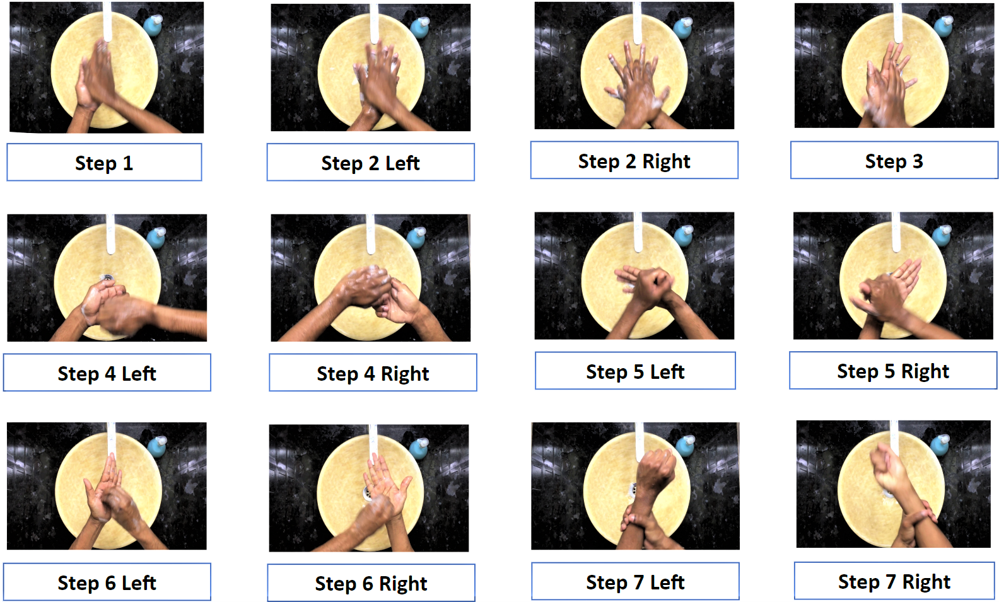

In [ ]:
from PIL import Image

img = Image.open('Sample-HandWashDataset.png')

img

## Displaying a video with embedded html

In [ ]:
# import IPython.display.HTML class, because this example will use html to embed a local video file
from IPython.display import display, HTML
# import base64.b64encode, the video file need to be encoded with base64 encoding.
from base64 import b64encode
import os

def Video(video_path):
  # open local mp4 video file with read permission, rb means read binary file. 
  with open(video_path, 'rb') as video:
    mp4 = video.read()

  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  display(HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url))


def get_ith_video_path(ROOT, i, step):
  steps = ['Step_1', 'Step_2_Left', 'Step_2_Right', 'Step_3', 'Step_4_Left', 'Step_4_Right', 'Step_5_Left', 'Step_5_Right', 'Step_6_Left', 'Step_6_Right', 'Step_7_Left', 'Step_7_Right']
  sinks = ['DarkSteelSink1', 'LightSteelSink1', 'CeramicSink1', 'SmallCeramicSink6', 'LightGraniteSink1', 'CeramicSink2'] 
  sink = [0] * 5 + [1] * 3 + [2] * 3 + [3] * 3 + [4] + [5] * 8
  group = [1] * 8 + [2] * 3 + [3] * 3 + [4] * 3 + [5] * 8
  
  video_group = group[i]
  if step == 0:
    group_path = 'G{:02d}'.format(video_group)
  else:
    group_path = 'G_{:02d}'.format(video_group)

  video_name = 'HandWash_{:03d}_A_{:02d}_{}.mp4'.format(i + 1, step + 1, group_path)
  return ROOT / steps[step] / video_name
  
# test 
for step in range(12):
  for i in range(25):
    video_path = get_ith_video_path(DIR, i, step)
    assert os.path.isfile(video_path)
          
#HandWashDataset/HandWashDataset/Step_2_Left/HandWash_025_A_02_G_05.mp4 
Video(get_ith_video_path(DIR, i=4, step=11))

## Loading a video with Decord

We use [Decord](https://github.com/dmlc/decord), a fast library for fast video loading for deep learning with a c++ backend and deep learning libraries bridges (including Pytorch of course!).

Using Decord we don't need to convert videos to images as is common practice, we load it directly as a tensor. 

We can see that the video contains 338 frames with 30 frames per second .

number of frames 370
avg fps: 30.0


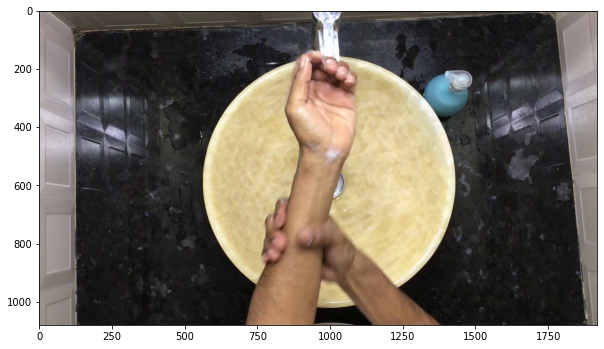

In [ ]:
from pathlib import Path
import decord
import matplotlib.pyplot as plt

DIR = Path('/content/HandWashDataset/HandWashDataset/')

image_path = (get_ith_video_path(DIR, i=0, step=11)).as_posix()
image_path = Path('/gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171/Step_1/HandWash_001_A_01_G01.mp4').as_posix()

vr = decord.VideoReader('HandWashDataset/HandWashDataset/Step_7_Left/HandWash_022_A_11_G_05.mp4')

print('number of frames', len(vr))
print('avg fps:', vr.get_avg_fps())

decord.bridge.set_bridge('torch')
vframes = vr.get_batch([0])

plt.figure(figsize=(10, 10))
plt.imshow(vframes[0])

## Why Decord

**Taken from [github](https://github.com/dmlc/decord). About decord:**

An efficient video loader for deep learning with smart shuffling that's super easy to digest.

Decord is comparatively faster than cv2 or pyAV. We show a benchmark graph also taken from the official repository.

![image](https://user-images.githubusercontent.com/3307514/71223638-7199f300-2289-11ea-9e16-104038f94a55.png)

## Some statistics

There are 25 videos for each step or substep (12 steps and 300 videos total).



In [ ]:
import os 
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

import av

steps_categories = ['Step_1', 'Step_2_Left', 'Step_2_Right', 'Step_3', 'Step_4_Left', 'Step_4_Right', 'Step_5_Left', 'Step_5_Right', 'Step_6_Left', 'Step_6_Right', 'Step_7_Left', 'Step_7_Right']

videos_category = []
videos_numframes = []
videos_resolution = []

for category in steps_categories:
  category_videos = os.listdir(DIR / category)
  for video in sorted(category_videos):
    video_path = (DIR / category / video).as_posix()
    container = av.open(video_path)
    stream = container.streams.video[0]
    video_numframes = stream.frames
    
    videos_category.append(category)
    videos_numframes.append(video_numframes)
    videos_resolution.append('{} x {}'.format(stream.width, stream.height))

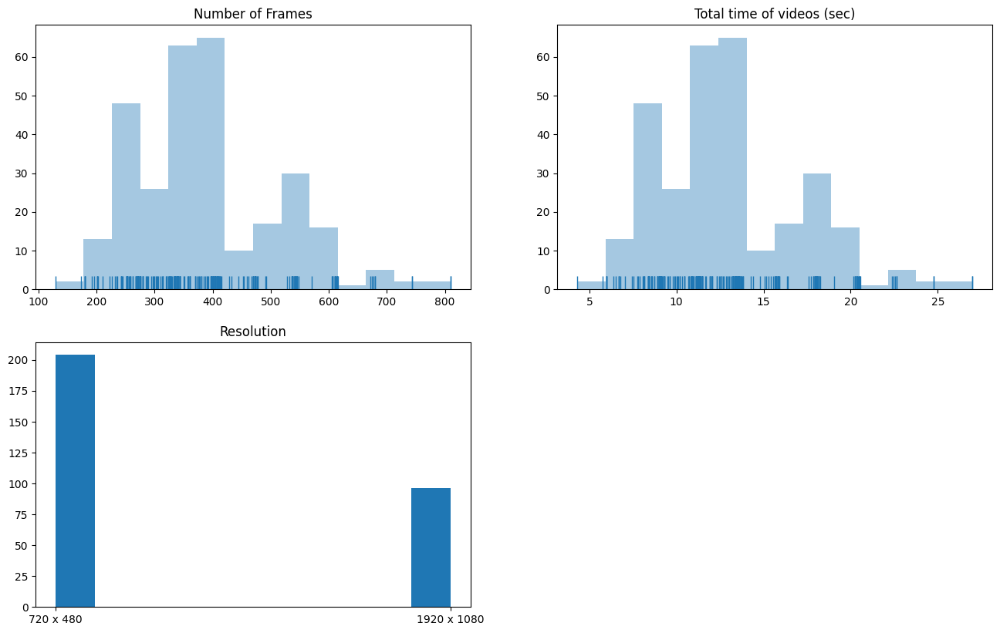

In [ ]:
subplots_shape = '22'
plt.figure(dpi=100, figsize=(16, 10))
plt.subplot(subplots_shape + '1')
plt.title('Number of Frames')
sns.distplot(np.array(videos_numframes), kde=False, rug=True);

plt.subplot(subplots_shape + '2')
plt.title('Total time of videos (sec)')
sns.distplot(np.array(videos_numframes) / 30, kde=False, rug=True);

plt.subplot(subplots_shape + '3')
plt.title('Resolution')
_ = plt.hist(np.array(videos_resolution))

In [ ]:
frame_rate = 30
frames_length_df = pd.DataFrame(zip(videos_category, videos_numframes), columns=['category', 'length'])
display(frames_length_df.describe())

frames_length_df.length = frames_length_df.length / 30
frames_length_df.columns = ['category', 'seconds']
frames_length_df.describe()

,length
count,300.000000
mean,387.343333
std,122.662269
min,129.000000
25%,296.250000
50%,365.500000
75%,467.500000
max,810.000000


,seconds
count,300.000000
mean,12.911444
std,4.088742
min,4.300000
25%,9.875000
50%,12.183333
75%,15.583333
max,27.000000


Average length of videos by class

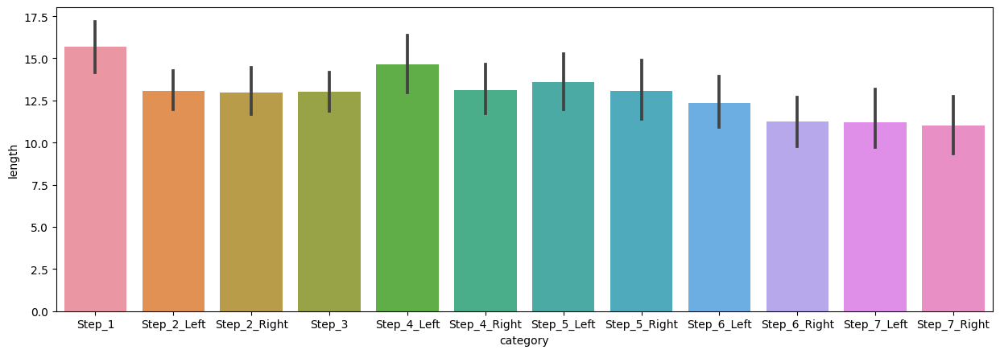

In [ ]:
frame_rate = 30
frames_length_df = pd.DataFrame(zip(videos_category, videos_numframes), columns=['category', 'length'])
frames_length_df.length = frames_length_df.length / 30

plt.figure(figsize=(15, 5), dpi=100)
_ = sns.barplot(x='category', y='length', data=frames_length_df)

#3. Video Sampling, preprocessing and Dataset class creation

There are many approaches to sampling, most of them do either dense or uniform sampling of short videos  in order to extract 16 frames (fixed size), which would then be feed into a model (e.g in Jester Dataset, the currently biggest gesture recognition dataset average length is 3 seconds). Some advanced methods include adaptive frame sampling.

But the dataset we are using has a small amount of videos with relatively long duration (12.9 seconds mean). In average, a video in HandWash Dataset has 387 frames. Extracting only 16 frames of every video would mean that, on average we would be throwing away $95.86\%$ of the data.

## Sampling Temporal Stride $\tau_t$

On the other hand, using every single frame of a video would be a waste of resources since sequential frames have very small variation. Instead of using every sequential frame we resample a video with temporal stride $\tau_t$.

One could think of $\frac{1}{\tau_t}$ as the temporal resolution (with 1.0 being the original frame rate and with ${\tau_t} = 2$ half of the original frame rate). We aim to explore different values for $\tau_t$.

## Sampling Clips

After resampling a video with a specified $\tau_t$ we form clips of a fixed size $\tau_{size}$ (e.g 16). The total number of subclips of a video with $n$ frames is $\left\lfloor\frac{n}{\tau_t}\right\rfloor - \tau_{size} + 1$. 

For sampling one clip we take a random starting position $p_0$ between $0$ and $\left\lfloor\frac{n}{\tau_t}\right\rfloor - \tau_{size}$ (inclusive) and select the $\tau_{size}$ frames in the range $\left[p_0, p_0 + \tau_{size}\right)$.


## Train, Validation and Test split

We only have 25 recordings, with each one divided in 12 steps. It is important to keep these recordings separate in train and validation. We select 15 random recordings and keep them for train, then other 5 are used for validation and the 5 left are used for test. In a couple cells below we show the resulting number of clips for different $\tau_t$ and a fixed random seed. 


In [3]:
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import random

import torch, torchvision

from torch.utils.data import Subset
from torchvision.datasets.utils import list_dir
from torchvision.datasets.folder import make_dataset
from torchvision.datasets.vision import VisionDataset

import decord

from torchvision.transforms import Lambda
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms

"""
Pytorch hasn't exposed Video transforms because they are unsure about the API
structure, nevertheless they refer to use the transforms in 
https://github.com/pytorch/vision/tree/master/references/video_classification
"""

def crop(vid, i, j, h, w):
  return vid[..., i:(i + h), j:(j + w)]

def center_crop(vid, output_size):
  h, w = vid.shape[-2:]
  th, tw = output_size

  i = int(round((h - th) / 2.))
  j = int(round((w - tw) / 2.))
  return crop(vid, i, j, th, tw)

def to_normalized_float_tensor(vid):
    return vid.permute(3, 0, 1, 2).to(torch.float32) / 255

def normalize(vid, mean, std):
    shape = (-1,) + (1,) * (vid.dim() - 1)
    mean = torch.as_tensor(mean).reshape(shape)
    std = torch.as_tensor(std).reshape(shape)
    return (vid - mean) / std

def hflip(vid):
    return vid.flip(dims=(-1,))

class RandomCrop(object):
    def __init__(self, size):
        self.size = size

    @staticmethod
    def get_params(vid, output_size):
        """Get parameters for ``crop`` for a random crop.
        """
        h, w = vid.shape[-2:]
        th, tw = output_size
        if w == tw and h == th:
            return 0, 0, h, w
        i = random.randint(0, h - th)
        j = random.randint(0, w - tw)
        return i, j, th, tw

    def __call__(self, vid):
        i, j, h, w = self.get_params(vid, self.size)
        return crop(vid, i, j, h, w)
    
    def __repr__(self):
      return 'RandomCrop(size={})'.format(self.size)

class CenterCrop(object):
    def __init__(self, size):
        self.size = size

    def __call__(self, vid):
        return center_crop(vid, self.size)
    
    def __repr__(self):
      return 'CenterCrop(size={})'.format(self.size)

class ToFloatTensorInZeroOne(object):
    def __call__(self, vid):
        return to_normalized_float_tensor(vid)

    def __repr__(self):
      return 'ToFloatTensorInZeroOne()'

class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, vid):
        return normalize(vid, self.mean, self.std)

    def __repr__(self):
      return 'Normalize(mean={}, std={})'.format(self.mean, self.std)

class RandomHorizontalFlip(object):
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, vid):
        if random.random() < self.p:
            return hflip(vid)
        return vid

    def __repr__(self):
      return 'RandomHorizontalFlip(p={})'.format(self.p)

class HandWashDataset(VisionDataset):
  """
  This dataset consider every video as a collection of video clips of fixed size, specified
    by ``frames_per_clip``.

    Args:
        root (string): Root directory of the Kinetics-400 Dataset.
        frames_per_clip (int): number of frames in a clip
        transform (callable, optional): A function/transform that takes in a TxHxWxC video
            and returns a transformed version.

    Returns:
        video (Tensor[T, H, W, C]): the `T` video frames
        label (int): class of the video clip
  """
  def __init__(self, root, frames_per_clip=16, temporal_stride=1,
               clips_per_video=1, extensions=('mp4',), transforms=None,
               split='train', random_state=0, precomputed_metadata=None):
    super(HandWashDataset, self).__init__(root)
    
    self.random_state = random_state
    self.split = split
    self.clips_per_video = clips_per_video
    self.transforms = transforms

    classes = list(sorted(list_dir(root)))
    class_to_idx = {classes[i]: i for i in range(len(classes))}
    self.classes = classes

    samples = make_dataset(self.root, class_to_idx, extensions, is_valid_file=None)
    # randomly split the 25 groups of videos
    np.random.seed(self.random_state)
    group_split = np.arange(1, 26)
    np.random.shuffle(group_split)
    
    group_split = {
        'train': group_split[0:15], 
        'val': group_split[15:20],
        'test': group_split[20:25]
        }

    # filter the 300 videos
    filtered_idx = []
    for i, (video_path, label) in enumerate(samples):
      video_name = video_path.split('/')[-1]
      video_group = int(video_name.split('_')[1])
      if (video_group in group_split[split]):
        filtered_idx.append(i)

    self.samples = Subset(samples, filtered_idx)
    video_list = [x[0] for x in self.samples]
    
    if precomputed_metadata is None:
      videos_nframes = []
      for video_path in video_list:
        vr = decord.VideoReader(video_path)
        nframes = len(vr)
        videos_nframes.append(nframes)
      self.videos_nframes = videos_nframes
    else:
      self.videos_nframes = precomputed_metadata['videos_nframes']

    self.compute_clips(frames_per_clip, temporal_stride)

  def compute_clips(self, frames_per_clip, temporal_stride):
    self.frames_per_clip = frames_per_clip
    self.temporal_stride = temporal_stride

    videos_nclips = []
    count_nclips = 0
    for video_nframes in self.videos_nframes:
      video_nclips = int((1.0 * video_nframes) // temporal_stride) - frames_per_clip + 1
      count_nclips += video_nclips
      videos_nclips.append(video_nclips)
    self.videos_nclips = videos_nclips
    self.count_nclips = count_nclips

  @property
  def metadata(self):
    return {
      'videos_nframes' : self.videos_nframes,
    }

  @property
  def num_clips(self):
    return self.count_nclips
    
  def __repr__(self):
    head = "Dataset " + self.__class__.__name__ + " - split " + self.split
    body = ["Number of videos: {}".format(len(self.samples)),
            "Number of clips: {}".format(self.num_clips),
            "Frames per clip: {}".format(self.frames_per_clip),
            "Temporal stride: {}".format(self.temporal_stride)]
    if self.root is not None:
        body.append("Root location: {}".format(self.root))
    body += self.extra_repr().splitlines()
    if hasattr(self, "transforms") and self.transforms is not None:
        body += [repr(self.transforms)]
    lines = [head] + [" " * self._repr_indent + line for line in body]
    return '\n'.join(lines)

  def __len__(self):
    return len(self.samples)

  def __getitem__(self, idx):
    # return the same clips of video for more consistent validation 
    # return a random clip for training
    if self.split in ['val', 'test']:
      np.random.seed(self.random_state)

    video_path, label = self.samples[idx]

    vr = decord.VideoReader(video_path)
    nframes = len(vr)
    
    clips = []
    for i in range(self.clips_per_video):
      starting_position = np.random.randint(self.videos_nclips[idx])
      frames_idx = (starting_position + np.arange(0, self.frames_per_clip))
      frames_idx = frames_idx * self.temporal_stride
      
      
      decord.bridge.set_bridge('torch')
      clip = vr.get_batch(frames_idx)
      if self.transforms:
        clip = self.transforms(clip)
      
      clips.append(clip)
    
    return torch.stack(clips), label

"""
``use_resized=True`` and ``use_precomputed_metadata=True`` for speed up

This will fail of course if you haven't resized the videos (with ffmpeg)
and at least run this once with ``use_precomputed_metadata=False`` once
"""
def get_datasets(use_resized=False, use_precomputed_metadata=False, 
                 transform=True, pretrain='kinetics400',
                 temporal_stride=1, eval_clips_per_video=2):
  print(pretrain)
  GDRIVE_DIR = Path('/gdrive/My Drive/HandWashCheckpoints')
  if pretrain == 'imagenet':
    GDRIVE_DIR = GDRIVE_DIR / 'HandWashResized'
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    crop_size = (224, 224)
  elif pretrain == 'kinetics400':
    # actually 172 x 128
    GDRIVE_DIR = GDRIVE_DIR / 'HandWashResized128x171'
    mean = [0.43216, 0.394666, 0.37645]
    std = [0.22803, 0.22145, 0.216989]
    crop_size = (112, 112)
  else:
    print('Select a valid pretrain')

  if use_resized:
    DIR = GDRIVE_DIR
  else:
    DIR = Path('/content/HandWashDataset/HandWashResized/')
    GDRIVE_DIR = Path('/gdrive/My Drive/HandWashCheckpoints')

  splits = ['train', 'val', 'test']
  dataset_transforms = {
    'train': transforms.Compose([
      ToFloatTensorInZeroOne(),
      RandomCrop(crop_size),
      RandomHorizontalFlip(),
      Normalize(mean, std) 
    ]),
    'val': transforms.Compose([
      ToFloatTensorInZeroOne(),
      CenterCrop(crop_size),
      Normalize(mean, std),
    ]),
    'test': transforms.Compose([
      ToFloatTensorInZeroOne(),
      CenterCrop(crop_size),
      Normalize(mean, std),
    ])
  }

  if use_precomputed_metadata:
    metadata = {
      split : torch.load(
        GDRIVE_DIR / ('{}_dataset_metadata'.format(split))
      ) for split in splits
    }

  datasets = { 
    split : HandWashDataset(
      root=DIR.as_posix(), extensions='mp4', 
      frames_per_clip=16, temporal_stride=temporal_stride,
      split=split, random_state=42,
      clips_per_video=(1 if split == 'train' else eval_clips_per_video),
      transforms=(dataset_transforms[split] if transform else None),
      precomputed_metadata=(metadata[split] if use_precomputed_metadata else None)
    ) for split in splits
  }

  if not use_precomputed_metadata:
    for split in splits:
      torch.save(
        obj=datasets[split].metadata,
        f=GDRIVE_DIR / ('{}_dataset_metadata'.format(split))
      )  

  for split in splits:
    print(datasets[split])
    print()
  return datasets


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize

## Showing a frame of a batch of clips

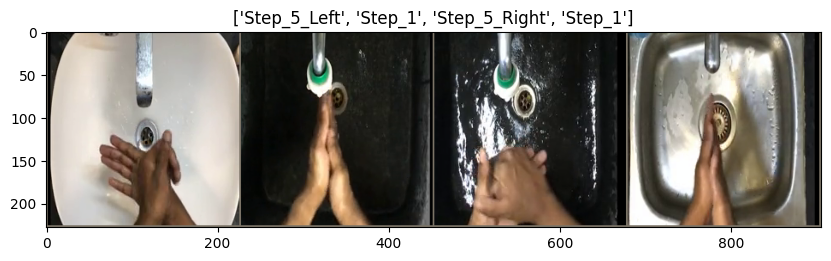

In [ ]:
def imshow(inp, title=None):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  mean = np.array([0.485, 0.456, 0.406])
  std = np.array([0.229, 0.224, 0.225])
  inp = std * inp + mean
  inp = np.clip(inp, 0, 1)
  plt.figure(dpi=100, figsize=(10, 20))
  plt.imshow(inp)
  if title is not None:
      plt.title(title)
  plt.pause(0.001)  # pause a bit so that plots are updated

train_loader = torch.utils.data.DataLoader(datasets['train'], batch_size=4, shuffle=True, num_workers=4)

batch, classes = next(iter(train_loader))

imgs = []
for clips in batch:
  clip = clips[0]
  clip = clip.permute(1, 0, 2, 3)
  imgs.append(clip[0])

inputs = torch.stack(imgs)
out = torchvision.utils.make_grid(inputs)
class_names = datasets['train'].classes
imshow(out, title=[class_names[x] for x in classes])

## Tables of Resulting number of clips

We vary $\tau_t$ and show a table with the resulting dataset sizes. Note that some clips may never be seen by our model.

In [ ]:
from IPython.display import display, HTML
import pandas as pd

def show_num_clips_table(step):
  fps = 30.0
  temporal_strides = [1, 1.25, 2, 2.5, 3.75, 4, 7.5, 8]
  num_clips = []
  for stride in temporal_strides:
    row = [stride, fps / stride]
    for split in splits:
      datasets[split].compute_clips(frames_per_clip=16, temporal_stride=stride)
      row.append(datasets[split].num_clips)
    num_clips.append(row)

  df = pd.DataFrame(num_clips, columns=['temporal_stride', 'frame_rate', 'train', 'val', 'test'])
  display(HTML(df.to_html(index=False)))

print('train size:', len(datasets['train']))
print('val size:', len(datasets['val']))
print('test size:', len(datasets['test']))

print('Counts of all possible clips with a specified temporal stride')
show_num_clips_table(step=1)


train size: 180
val size: 60
test size: 60
Counts of all possible clips with a specified temporal stride


temporal_stride,frame_rate,train,val,test
1.00,30.00,65229,19141,27333
1.25,24.00,51572,15109,21663
2.00,15.00,31228,9108,13199
2.50,12.00,24402,7096,10371
3.75,8.00,15337,4415,6605
4.00,7.50,14220,4089,6133
7.50,4.00,6284,1744,2841
8.00,3.75,5717,1582,2602


#4. Training and evaluation



## Training

### Preprocessing and Sampling

- We squash the videos spatial resolution (resize to 171 x 128) with ffmpeg, this speeds up the training since resizing is the most expensive preprocessing step for images. 

- In each epoch we sample one clip for every video in the training set at random, this way we are not biased against classes with longer videos. We didn't set a random seed for training which means that for every epoch we are potentially receiving a different clip for each video. We note that training is very chaotic in the first few epochs.

- During training, we randomly crop the images of a clip to size (171 x 128). Each frame is cropped equally to the other frames in a clip but different clips may receive different crops. We also perform random horizontal flip to clips in training. Random horizontal flip and random crop are forms of data augmentation.


Note: We suspect it would be a bad idea to randomly crop the frames of a clip indepently, since it would introduce noise and the frames would lose temporal correlation, furthermore in evaluation we don't perform random cropping so this closes on the train / evaluation disparity.

### Loss
We use ```nn.CrossEntropyLoss```. which combines ```nn.LogSoftmax()``` and ```nn.NLLLoss()```. Which can be described as 

$\text{loss}(x, class) = -\log\left(\frac{\exp{x[class]}}{\sum_j{\exp{x[j]}}}\right)$

### Optimizer 
We test standard Adam  and SGD with momentum. We use learning rate 1e-3 and decay the learnign rate by a factor of 0.1 every 7 epochs.

### Epochs and checkpoints

In every experiment we train a model for at least 40 epochs while keeping the set of model weights with maximal accuracy in validation. The last epoch that was ran is also kept for resuming training if wanted (we also store optimizer and other objects state). We ran a first experiment for 200 epochs and saw that training with our current setup plateaued in about 40 epochs.

## Evaluation

### Preprocessing

- Resizing is done the same way as training. All the clips are center cropped to size (171 x 128).

### Sampling

- We sample a fixed number (e.g 2) of clips of each video instead of one. The sampling of the clips is random but with a fixed seed for consistent evaluation.

### Postprocessing of predictions

- Each clip of a video is processed indepently of each other but the predictions of each one are postprocessed to improve the prediction performance of a video (e.g averaging the softmax scores).



## Models

The models that we tested are implementations of the models in Tran et. al "A Closer Look at Spatiotemporal Convolutions for Action Recognition". The models are pretrained on Kinetics-400 Action Recognition dataset.

![2](https://drive.google.com/uc?export=view&id=12LvLDyRYX64f7SoEcNc9cSgo_ZaK7y85)


![3](https://drive.google.com/uc?export=view&id=1JBX1alD2gF5LVYEeGhtM9btJD-NnYUAK)

The models are:
- MC3: Mix of 3D convolutions and 2D convolutions
- R3D: 3D convoltions
- R(2+1)D: Descomposition of 3D convolutions into 2D spatial convolutions and 1D temporal convolutions.

### Implementation details

Models process 5 dimensional tensors of shape

```[batch_size x num_clips,  3, frames_per_clip, H, W]``` 

and return tensors of shape 

```[batch_size x num_clips, num_classes]```. 

But our dataset class returns tensors of shape 

```[batch_size, num_clips,  3, frames_per_clip, H, W]``` 

So, before fedding them to the models we create a pytorch view so that the models can process each clip indepently and postprocess predictions of multi-clip samples outside of model definitions (see postprocess_multiclip_prediction function).

### Number of *trainable* parameters in each model



In [ ]:
import torchvision.models.video as models

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print('R(2+1)D', count_parameters(models.r2plus1d_18()))
print('MC3', count_parameters(models.mc3_18()))
print('R3D', count_parameters(models.r3d_18()))

R(2+1)D 31505325
MC3 11695440
R3D 33371472


## First experiment

In the first experiment we use code inspired by the official Pytorch transfer learning [tutorial](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html#finetuning-the-convnet) for computer vision and achieve a validation accuracy of 0.63 in epoch 32 and in epoch 181.

The trained model is R(2+1)D with SGD

In [ ]:
def build_train_args(model_name, gradient_accumulation_steps=1,batch_size=32, lr=1e-4):
  args = {
      'checkpoints_path': Path('/gdrive/My Drive/HandWashCheckpoints'),
      'model_name': model_name,
      'gradient_accumulation_steps': gradient_accumulation_steps,
      'batch_size': batch_size,
      'lr': lr,
  }
  return args

def save_checkpoint(args, epoch, best_score, model, optimizer, scheduler=None, best=False):
  PATH = args['checkpoints_path'] / args['model_name']
  PATH.mkdir(exist_ok=True)
  checkpoint_path = PATH / ('best' if best else 'latest')
    
  state_dict = {
    'epoch': epoch,
    'best_score': best_score,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
  }
    
  if scheduler is not None:
    state_dict['scheduler_state_dict'] = scheduler.state_dict()
    
  torch.save(state_dict, checkpoint_path)

def load_checkpoint(args, best=False):
  PATH = args['checkpoints_path'] / args['model_name']
  if best:
    return torch.load(PATH / 'best')
  else:
    return torch.load(PATH / 'latest')

def postprocess_multiclip_outputs(outputs, num_clips_per_video):
  """
  Expects a tensor of shape [batch_size x num_clips_per_video, num_clasess]
  Returns a tensor of shape [batch_size, num_clasess]
  """
  if num_clips_per_video != 1:
    batch_size = outputs.shape[0] // num_clips_per_video
    # resize to [batch_size, num_clips_per_video, num_classes]
    outputs = outputs.view(batch_size, num_clips_per_video, -1)
    # take mean along second dimension
    outputs = torch.mean(outputs, 1)
  
  return outputs

def train_model(args, model, criterion, optimizer, scheduler, num_epochs=25, resume=False):
    since = time.time()

    best_score = 0.0
    epoch = 0
    
    if resume:
      checkpoint = load_checkpoint(args)
      epoch = checkpoint['epoch']
      best_score = checkpoint['best_score']
      model.load_state_dict(checkpoint['model_state_dict'])
      optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
      scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
      print(checkpoint)
      print('Resuming training with model with Accuracy: {}'.format(best_score))

    while epoch < num_epochs: 
      print('Epoch {}/{}'.format(epoch, num_epochs - 1))
      print('-' * 10)

      # Each epoch has a training and validation phase
      for phase in ['train', 'val']:
        if phase == 'train':
          model.train()  # Set model to training mode
        else:
          model.eval()   # Set model to evaluate mode

        running_loss = 0.0
        running_corrects = 0
        
        # Iterate over data.
        for clips, labels in tqdm(dataloaders[phase]):
          batch_size, num_clips_per_video, c, frames_per_clip, h, w = clips.shape
          # process each clip indepently
          inputs = clips.view(batch_size * num_clips_per_video, c, frames_per_clip, h, w)
          inputs = inputs.to(device)
          labels = labels.to(device)

          # zero the parameter gradients
          optimizer.zero_grad()

          # forward
          # track history if only in train
          with torch.set_grad_enabled(phase == 'train'):
            outputs = model(inputs)
            # postprocess each clip output 
            outputs = postprocess_multiclip_outputs(outputs, num_clips_per_video)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # backward + optimize only if in training phase
            if phase == 'train':
              loss.backward()
              optimizer.step()

          # statistics
          running_loss += loss.item() * inputs.size(0)
          running_corrects += torch.sum(preds == labels.data)
        if phase == 'train':
          scheduler.step()

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_score = running_corrects.double() / dataset_sizes[phase]

        print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_score))
          
        # Save last epoch model
        if phase == 'val':
          epoch += 1    
          save_checkpoint(args, epoch, best_score, model, optimizer, scheduler)
          # Save best mode
          if epoch_score > best_score:
            save_checkpoint(args, epoch, best_score, model, optimizer, scheduler, best=True)

      print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    
    return model

def evaluate_model(args, model, criterion, pretrained=False):
    since = time.time()
    
    if pretrained:
      checkpoint = load_checkpoint(args, best=True)
      epoch = checkpoint['epoch']
      best_score = checkpoint['best_score']
      model.load_state_dict(checkpoint['model_state_dict'])
      print('Evaluating best weights of {} with validation Acc: {} found in epoch {}'.format(args['model_name'], best_score, epoch))

    print('-' * 10)

    # Set model to evaluate mode
    model.eval()   

    running_loss = 0.0
    running_corrects = 0
    runnin_preds = np.zeros((0, 12))
    running_labels = np.zeros((0, 12))
    
    # Iterate over data.
    for clips, labels in tqdm(dataloaders[phase]):
      batch_size, num_clips_per_video, c, frames_per_clip, h, w = clips.shape
      
      running_labels = np.append(running_labels, labels.numpy(), axis=0)

      # process each clip indepently
      inputs = clips.view(batch_size * num_clips_per_video, c, frames_per_clip, h, w)
      inputs = inputs.to(device)
      labels = labels.to(device)

      # forward
      # track history if only in train
      with torch.no_grad():
        outputs = model(inputs)
        # postprocess each clip output 
        outputs = postprocess_multiclip_outputs(outputs, num_clips_per_video)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_preds = np.append(running_preds, preds.cpu().detach().numpy(), axis=0)

      # statistics
      running_loss += loss.item() * inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / dataset_sizes[phase]
    epoch_score = running_corrects.double() / dataset_sizes[phase]

    print('{} Loss: {:.4f} Acc: {:.4f}'.format(split, epoch_loss, epoch_score))

    print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    
    return model

In [ ]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import time
from tqdm.notebook import tqdm

train_args = build_train_args(
  model_name='r2plus1d_18', 
  batch_size=24,
  lr=1e-3
)

for key in train_args:
  print(key, '-' * 3, train_args[key])
dataloaders = {
  x: torch.utils.data.DataLoader(
      datasets[x], batch_size=train_args['batch_size'],
      shuffle=True, num_workers=8,
  ) for x in ['train', 'val', 'test']
}
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_ft = torchvision.models.video.r2plus1d_18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model_ft.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model_ft = model_ft.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=train_args['lr'], momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

checkpoints_path --- /gdrive/My Drive/HandWashCheckpoints
model_name --- r2plus1d_18
batch_size --- 24
lr --- 0.001


In [ ]:
model_ft = train_model(train_args, model_ft, criterion, optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24
----------



train Loss: 2.5653 Acc: 0.1333



val Loss: 5.0672 Acc: 0.1167

Epoch 1/24
----------



train Loss: 2.4232 Acc: 0.1611



val Loss: 4.8380 Acc: 0.1500

Epoch 2/24
----------



train Loss: 2.3182 Acc: 0.2000



val Loss: 4.7211 Acc: 0.2167

Epoch 3/24
----------



train Loss: 2.1845 Acc: 0.3833



val Loss: 4.5671 Acc: 0.2667

Epoch 4/24
----------



train Loss: 2.0405 Acc: 0.5500



val Loss: 4.3753 Acc: 0.3500

Epoch 5/24
----------



train Loss: 1.8646 Acc: 0.6444



val Loss: 4.2260 Acc: 0.4500

Epoch 6/24
----------



train Loss: 1.6893 Acc: 0.6889



val Loss: 4.0309 Acc: 0.5833

Epoch 7/24
----------



train Loss: 1.6032 Acc: 0.6667



val Loss: 4.0404 Acc: 0.5667

Epoch 8/24
----------



train Loss: 1.5716 Acc: 0.7111



val Loss: 4.0314 Acc: 0.5667

Epoch 9/24
----------



train Loss: 1.5388 Acc: 0.7389



val Loss: 4.0052 Acc: 0.5333

Epoch 10/24
----------



train Loss: 1.5342 Acc: 0.7167



val Loss: 3.9912 Acc: 0.5500

Epoch 11/24
----------



train Loss: 1.5167 Acc: 0.7444



val Loss: 3.9757 Acc: 0.5333

Epoch 12/24
----------



train Loss: 1.4848 Acc: 0.7278



val Loss: 3.9514 Acc: 0.5500

Epoch 13/24
----------



train Loss: 1.5005 Acc: 0.7389



val Loss: 3.9293 Acc: 0.5500

Epoch 14/24
----------



train Loss: 1.4663 Acc: 0.7778



val Loss: 3.9154 Acc: 0.5667

Epoch 15/24
----------



train Loss: 1.4451 Acc: 0.7889



val Loss: 3.9121 Acc: 0.5833

Epoch 16/24
----------



train Loss: 1.4779 Acc: 0.7889



val Loss: 3.9217 Acc: 0.5500

Epoch 17/24
----------



train Loss: 1.4649 Acc: 0.8056



val Loss: 3.9275 Acc: 0.5667

Epoch 18/24
----------



train Loss: 1.4897 Acc: 0.7722



val Loss: 3.9297 Acc: 0.6000

Epoch 19/24
----------



train Loss: 1.4576 Acc: 0.7611



val Loss: 3.9323 Acc: 0.5833

Epoch 20/24
----------



train Loss: 1.4815 Acc: 0.7667



val Loss: 3.9254 Acc: 0.5833

Epoch 21/24
----------



train Loss: 1.4907 Acc: 0.7667



val Loss: 3.9043 Acc: 0.5167

Epoch 22/24
----------



train Loss: 1.4816 Acc: 0.7667



val Loss: 3.9149 Acc: 0.5667

Epoch 23/24
----------



train Loss: 1.4526 Acc: 0.8333



val Loss: 3.9252 Acc: 0.5833

Epoch 24/24
----------



train Loss: 1.4426 Acc: 0.8389



val Loss: 3.9155 Acc: 0.5500

Training complete in 17m 52s


In [ ]:
model_ft = train_model(train_args, model_ft, criterion, optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=100, resume=True)

Resuming training with model with Accuracy: 0.0
Epoch 25/99
----------



train Loss: 1.4655 Acc: 0.7778



val Loss: 3.9216 Acc: 0.5333

Epoch 26/99
----------



train Loss: 1.4780 Acc: 0.7889



val Loss: 3.9224 Acc: 0.5667

Epoch 27/99
----------



train Loss: 1.4554 Acc: 0.7722



val Loss: 3.9151 Acc: 0.5667

Epoch 28/99
----------



train Loss: 1.4569 Acc: 0.7667



val Loss: 3.9195 Acc: 0.5667

Epoch 29/99
----------



train Loss: 1.4501 Acc: 0.7556



val Loss: 3.9326 Acc: 0.5667

Epoch 30/99
----------



train Loss: 1.4536 Acc: 0.7889



val Loss: 3.9283 Acc: 0.6000

Epoch 31/99
----------



train Loss: 1.4415 Acc: 0.8111



val Loss: 3.9387 Acc: 0.5833

Epoch 32/99
----------



train Loss: 1.4553 Acc: 0.7944



val Loss: 3.9225 Acc: 0.6333

Epoch 33/99
----------



train Loss: 1.4170 Acc: 0.7833



val Loss: 3.9145 Acc: 0.6167

Epoch 34/99
----------



train Loss: 1.4735 Acc: 0.7889



val Loss: 3.9184 Acc: 0.5667

Epoch 35/99
----------



train Loss: 1.4797 Acc: 0.7611



val Loss: 3.9180 Acc: 0.5667

Epoch 36/99
----------



train Loss: 1.4561 Acc: 0.7722



val Loss: 3.9001 Acc: 0.5500

Epoch 37/99
----------



train Loss: 1.4279 Acc: 0.8167



val Loss: 3.9149 Acc: 0.5333

Epoch 38/99
----------



train Loss: 1.4402 Acc: 0.7833



val Loss: 3.9118 Acc: 0.5167

Epoch 39/99
----------



train Loss: 1.4776 Acc: 0.7611



val Loss: 3.9153 Acc: 0.5500

Epoch 40/99
----------



train Loss: 1.4579 Acc: 0.8111



val Loss: 3.9275 Acc: 0.5500

Epoch 41/99
----------



train Loss: 1.4659 Acc: 0.7500



val Loss: 3.9135 Acc: 0.5833

Epoch 42/99
----------



train Loss: 1.5089 Acc: 0.7333



val Loss: 3.8983 Acc: 0.6000

Epoch 43/99
----------



train Loss: 1.4724 Acc: 0.7667



val Loss: 3.9086 Acc: 0.5500

Epoch 44/99
----------



train Loss: 1.4264 Acc: 0.7778



val Loss: 3.9140 Acc: 0.6000

Epoch 45/99
----------



train Loss: 1.4746 Acc: 0.7778



val Loss: 3.9057 Acc: 0.5833

Epoch 46/99
----------



train Loss: 1.4931 Acc: 0.7611



val Loss: 3.9074 Acc: 0.6167

Epoch 47/99
----------



train Loss: 1.4630 Acc: 0.7778



val Loss: 3.9237 Acc: 0.5333

Epoch 48/99
----------



train Loss: 1.4534 Acc: 0.7778



val Loss: 3.9120 Acc: 0.5833

Epoch 49/99
----------



train Loss: 1.4973 Acc: 0.7611



val Loss: 3.9009 Acc: 0.5500

Epoch 50/99
----------



train Loss: 1.4571 Acc: 0.7056



val Loss: 3.9179 Acc: 0.5500

Epoch 51/99
----------



train Loss: 1.4238 Acc: 0.7944



val Loss: 3.9077 Acc: 0.5833

Epoch 52/99
----------



train Loss: 1.4848 Acc: 0.7611



val Loss: 3.9136 Acc: 0.5833

Epoch 53/99
----------



train Loss: 1.4781 Acc: 0.7389



val Loss: 3.9143 Acc: 0.5500

Epoch 54/99
----------



train Loss: 1.4806 Acc: 0.7722



val Loss: 3.9247 Acc: 0.5333

Epoch 55/99
----------



train Loss: 1.4569 Acc: 0.8111



val Loss: 3.9288 Acc: 0.5500

Epoch 56/99
----------



train Loss: 1.4484 Acc: 0.8222



val Loss: 3.9180 Acc: 0.5833

Epoch 57/99
----------



train Loss: 1.4624 Acc: 0.7778



val Loss: 3.9185 Acc: 0.6000

Epoch 58/99
----------



train Loss: 1.4782 Acc: 0.7500



val Loss: 3.9297 Acc: 0.5667

Epoch 59/99
----------



train Loss: 1.4588 Acc: 0.7944



val Loss: 3.9109 Acc: 0.5667

Epoch 60/99
----------



train Loss: 1.4780 Acc: 0.7611



val Loss: 3.8947 Acc: 0.5833

Epoch 61/99
----------



train Loss: 1.4392 Acc: 0.8056



val Loss: 3.9053 Acc: 0.5833

Epoch 62/99
----------



train Loss: 1.4513 Acc: 0.7556



val Loss: 3.9138 Acc: 0.5667

Epoch 63/99
----------



train Loss: 1.4422 Acc: 0.7889



val Loss: 3.8952 Acc: 0.5833

Epoch 64/99
----------



train Loss: 1.4416 Acc: 0.8056



val Loss: 3.9066 Acc: 0.5667

Epoch 65/99
----------



train Loss: 1.5025 Acc: 0.7778



val Loss: 3.9092 Acc: 0.5500

Epoch 66/99
----------



train Loss: 1.4953 Acc: 0.7667



val Loss: 3.9017 Acc: 0.5833

Epoch 67/99
----------



train Loss: 1.4962 Acc: 0.7556



val Loss: 3.9148 Acc: 0.5833

Epoch 68/99
----------



train Loss: 1.4596 Acc: 0.7889



val Loss: 3.9188 Acc: 0.5833

Epoch 69/99
----------



train Loss: 1.4641 Acc: 0.8000



val Loss: 3.9208 Acc: 0.5500

Epoch 70/99
----------



train Loss: 1.4538 Acc: 0.7778



val Loss: 3.9212 Acc: 0.5667

Epoch 71/99
----------



train Loss: 1.4494 Acc: 0.8056



val Loss: 3.9230 Acc: 0.5667

Epoch 72/99
----------



train Loss: 1.4711 Acc: 0.7389



val Loss: 3.9252 Acc: 0.5333

Epoch 73/99
----------



train Loss: 1.4328 Acc: 0.8000



val Loss: 3.9233 Acc: 0.5500

Epoch 74/99
----------



train Loss: 1.4650 Acc: 0.7667



val Loss: 3.9291 Acc: 0.5833

Epoch 75/99
----------



train Loss: 1.4345 Acc: 0.7778



val Loss: 3.9138 Acc: 0.5833

Epoch 76/99
----------



train Loss: 1.5057 Acc: 0.7056



val Loss: 3.9130 Acc: 0.5833

Epoch 77/99
----------



train Loss: 1.4751 Acc: 0.7611



val Loss: 3.9064 Acc: 0.5500

Epoch 78/99
----------



train Loss: 1.4485 Acc: 0.7556



val Loss: 3.9194 Acc: 0.5833

Epoch 79/99
----------



train Loss: 1.4802 Acc: 0.7278



val Loss: 3.9147 Acc: 0.6000

Epoch 80/99
----------



train Loss: 1.5000 Acc: 0.7556



val Loss: 3.8962 Acc: 0.5833

Epoch 81/99
----------



train Loss: 1.4752 Acc: 0.7722



val Loss: 3.9091 Acc: 0.5500

Epoch 82/99
----------



train Loss: 1.4975 Acc: 0.7667



val Loss: 3.9172 Acc: 0.5333

Epoch 83/99
----------



train Loss: 1.4708 Acc: 0.7333



val Loss: 3.9249 Acc: 0.5333

Epoch 84/99
----------



train Loss: 1.4640 Acc: 0.7444



val Loss: 3.9163 Acc: 0.5667

Epoch 85/99
----------



train Loss: 1.4528 Acc: 0.7722



val Loss: 3.9200 Acc: 0.5333

Epoch 86/99
----------



train Loss: 1.5206 Acc: 0.7389



val Loss: 3.9187 Acc: 0.5667

Epoch 87/99
----------



train Loss: 1.4278 Acc: 0.7833



val Loss: 3.9209 Acc: 0.5833

Epoch 88/99
----------



train Loss: 1.4804 Acc: 0.7611



val Loss: 3.9198 Acc: 0.6000

Epoch 89/99
----------



train Loss: 1.4679 Acc: 0.7667



val Loss: 3.9009 Acc: 0.5500

Epoch 90/99
----------



train Loss: 1.4867 Acc: 0.7722



val Loss: 3.9163 Acc: 0.5667

Epoch 91/99
----------



train Loss: 1.4789 Acc: 0.7611



val Loss: 3.9233 Acc: 0.6000

Epoch 92/99
----------



train Loss: 1.4891 Acc: 0.7667



val Loss: 3.9196 Acc: 0.6000

Epoch 93/99
----------



train Loss: 1.4937 Acc: 0.7778



val Loss: 3.9122 Acc: 0.5500

Epoch 94/99
----------



train Loss: 1.4774 Acc: 0.7889



val Loss: 3.9170 Acc: 0.5500

Epoch 95/99
----------



train Loss: 1.4572 Acc: 0.7722



val Loss: 3.9293 Acc: 0.5333

Epoch 96/99
----------



train Loss: 1.4581 Acc: 0.7333



val Loss: 3.9363 Acc: 0.5333

Epoch 97/99
----------



train Loss: 1.4873 Acc: 0.7611



val Loss: 3.9190 Acc: 0.5833

Epoch 98/99
----------



train Loss: 1.4867 Acc: 0.7333



val Loss: 3.9210 Acc: 0.5833

Epoch 99/99
----------



train Loss: 1.4430 Acc: 0.7833



val Loss: 3.9151 Acc: 0.5667

Training complete in 53m 5s


In [ ]:
model_ft = train_model(train_args, model_ft, criterion, optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=200, resume=True)

Resuming training with model with Accuracy: 0.0
Epoch 100/199
----------



train Loss: 1.4914 Acc: 0.7833



val Loss: 3.9097 Acc: 0.6000

Epoch 101/199
----------



train Loss: 1.4870 Acc: 0.7111



val Loss: 3.9092 Acc: 0.5833

Epoch 102/199
----------



train Loss: 1.4903 Acc: 0.7889



val Loss: 3.9115 Acc: 0.5667

Epoch 103/199
----------



train Loss: 1.5152 Acc: 0.7278



val Loss: 3.9176 Acc: 0.5667

Epoch 104/199
----------



train Loss: 1.4552 Acc: 0.7333



val Loss: 3.9206 Acc: 0.5500

Epoch 105/199
----------



train Loss: 1.4728 Acc: 0.7556



val Loss: 3.9099 Acc: 0.5833

Epoch 106/199
----------



train Loss: 1.4758 Acc: 0.7444



val Loss: 3.9229 Acc: 0.6000

Epoch 107/199
----------



train Loss: 1.4911 Acc: 0.7611



val Loss: 3.9305 Acc: 0.5500

Epoch 108/199
----------



train Loss: 1.4663 Acc: 0.8111



val Loss: 3.9241 Acc: 0.5667

Epoch 109/199
----------



train Loss: 1.4804 Acc: 0.7556



val Loss: 3.9314 Acc: 0.5833

Epoch 110/199
----------



train Loss: 1.4802 Acc: 0.7611



val Loss: 3.9246 Acc: 0.5833

Epoch 111/199
----------



train Loss: 1.4558 Acc: 0.7500



val Loss: 3.9130 Acc: 0.5833

Epoch 112/199
----------



train Loss: 1.4465 Acc: 0.7889



val Loss: 3.9199 Acc: 0.5667

Epoch 113/199
----------



train Loss: 1.4429 Acc: 0.8167



val Loss: 3.9053 Acc: 0.5333

Epoch 114/199
----------



train Loss: 1.4376 Acc: 0.7833



val Loss: 3.9072 Acc: 0.6000

Epoch 115/199
----------



train Loss: 1.4563 Acc: 0.7556



val Loss: 3.9039 Acc: 0.6000

Epoch 116/199
----------



train Loss: 1.4868 Acc: 0.7833



val Loss: 3.9142 Acc: 0.5667

Epoch 117/199
----------



train Loss: 1.4451 Acc: 0.8111



val Loss: 3.9038 Acc: 0.5333

Epoch 118/199
----------



train Loss: 1.4663 Acc: 0.7556



val Loss: 3.8983 Acc: 0.5667

Epoch 119/199
----------



train Loss: 1.4665 Acc: 0.7722



val Loss: 3.9142 Acc: 0.5667

Epoch 120/199
----------



train Loss: 1.4706 Acc: 0.7833



val Loss: 3.9150 Acc: 0.5833

Epoch 121/199
----------



train Loss: 1.4554 Acc: 0.7889



val Loss: 3.9136 Acc: 0.6000

Epoch 122/199
----------



train Loss: 1.4588 Acc: 0.7389



val Loss: 3.9129 Acc: 0.6000

Epoch 123/199
----------



train Loss: 1.4682 Acc: 0.7889



val Loss: 3.9011 Acc: 0.6000

Epoch 124/199
----------



train Loss: 1.4530 Acc: 0.7500



val Loss: 3.9232 Acc: 0.5667

Epoch 125/199
----------



train Loss: 1.4381 Acc: 0.7889



val Loss: 3.9280 Acc: 0.5500

Epoch 126/199
----------



train Loss: 1.4860 Acc: 0.7333



val Loss: 3.9210 Acc: 0.5833

Epoch 127/199
----------



train Loss: 1.4554 Acc: 0.7889



val Loss: 3.9199 Acc: 0.5833

Epoch 128/199
----------



train Loss: 1.4377 Acc: 0.7722



val Loss: 3.9177 Acc: 0.6000

Epoch 129/199
----------



train Loss: 1.4867 Acc: 0.7667



val Loss: 3.9106 Acc: 0.6000

Epoch 130/199
----------



train Loss: 1.4900 Acc: 0.7556



val Loss: 3.9255 Acc: 0.5667

Epoch 131/199
----------



train Loss: 1.4885 Acc: 0.7833



val Loss: 3.9174 Acc: 0.5833

Epoch 132/199
----------



train Loss: 1.4959 Acc: 0.7833



val Loss: 3.9278 Acc: 0.5667

Epoch 133/199
----------



train Loss: 1.4378 Acc: 0.8056



val Loss: 3.9203 Acc: 0.5833

Epoch 134/199
----------



train Loss: 1.4475 Acc: 0.7833



val Loss: 3.9223 Acc: 0.5667

Epoch 135/199
----------



train Loss: 1.4577 Acc: 0.8056



val Loss: 3.9056 Acc: 0.5667

Epoch 136/199
----------



train Loss: 1.4797 Acc: 0.7833



val Loss: 3.9033 Acc: 0.5333

Epoch 137/199
----------



train Loss: 1.4997 Acc: 0.7611



val Loss: 3.9131 Acc: 0.5667

Epoch 138/199
----------



train Loss: 1.4578 Acc: 0.7944



val Loss: 3.9159 Acc: 0.5667

Epoch 139/199
----------



train Loss: 1.4819 Acc: 0.7611



val Loss: 3.9357 Acc: 0.5667

Epoch 140/199
----------



train Loss: 1.4584 Acc: 0.7444



val Loss: 3.9291 Acc: 0.6000

Epoch 141/199
----------



train Loss: 1.4450 Acc: 0.7833



val Loss: 3.9373 Acc: 0.6000

Epoch 142/199
----------



train Loss: 1.4718 Acc: 0.7611



val Loss: 3.9199 Acc: 0.5833

Epoch 143/199
----------



train Loss: 1.4509 Acc: 0.7556



val Loss: 3.9357 Acc: 0.5500

Epoch 144/199
----------



train Loss: 1.4522 Acc: 0.7500



val Loss: 3.9108 Acc: 0.5833

Epoch 145/199
----------



train Loss: 1.4530 Acc: 0.7833



val Loss: 3.9122 Acc: 0.5833

Epoch 146/199
----------



train Loss: 1.4426 Acc: 0.7778



val Loss: 3.9247 Acc: 0.6000

Epoch 147/199
----------



train Loss: 1.4565 Acc: 0.7944



val Loss: 3.9191 Acc: 0.6000

Epoch 148/199
----------



train Loss: 1.4513 Acc: 0.8333



val Loss: 3.9190 Acc: 0.5667

Epoch 149/199
----------



train Loss: 1.4645 Acc: 0.7833



val Loss: 3.9056 Acc: 0.6000

Epoch 150/199
----------



train Loss: 1.4617 Acc: 0.7333



val Loss: 3.9091 Acc: 0.5667

Epoch 151/199
----------



train Loss: 1.4147 Acc: 0.7944



val Loss: 3.9217 Acc: 0.5833

Epoch 152/199
----------



train Loss: 1.4542 Acc: 0.7778



val Loss: 3.9303 Acc: 0.5833

Epoch 153/199
----------



train Loss: 1.4320 Acc: 0.7722



val Loss: 3.9142 Acc: 0.6000

Epoch 154/199
----------



train Loss: 1.4641 Acc: 0.7611



val Loss: 3.9185 Acc: 0.5833

Epoch 155/199
----------



train Loss: 1.4674 Acc: 0.7889



val Loss: 3.9373 Acc: 0.5500

Epoch 156/199
----------



train Loss: 1.4274 Acc: 0.7833



val Loss: 3.9276 Acc: 0.5833

Epoch 157/199
----------



train Loss: 1.4786 Acc: 0.7889



val Loss: 3.9203 Acc: 0.5500

Epoch 158/199
----------



train Loss: 1.4389 Acc: 0.8167



val Loss: 3.9174 Acc: 0.5833

Epoch 159/199
----------



train Loss: 1.4624 Acc: 0.7778



val Loss: 3.9155 Acc: 0.5667

Epoch 160/199
----------



train Loss: 1.4377 Acc: 0.7611



val Loss: 3.9251 Acc: 0.6000

Epoch 161/199
----------



train Loss: 1.4505 Acc: 0.7278



val Loss: 3.9057 Acc: 0.5833

Epoch 162/199
----------



train Loss: 1.4640 Acc: 0.7611



val Loss: 3.9093 Acc: 0.5833

Epoch 163/199
----------



train Loss: 1.4709 Acc: 0.7944



val Loss: 3.9268 Acc: 0.6000

Epoch 164/199
----------



train Loss: 1.4817 Acc: 0.7722



val Loss: 3.9198 Acc: 0.5500

Epoch 165/199
----------



train Loss: 1.4236 Acc: 0.8000



val Loss: 3.9217 Acc: 0.5333

Epoch 166/199
----------



train Loss: 1.4499 Acc: 0.7556



val Loss: 3.9425 Acc: 0.5667

Epoch 167/199
----------



train Loss: 1.4322 Acc: 0.8111



val Loss: 3.9391 Acc: 0.5500

Epoch 168/199
----------



train Loss: 1.4838 Acc: 0.7778



val Loss: 3.9241 Acc: 0.5667

Epoch 169/199
----------



train Loss: 1.4671 Acc: 0.7278



val Loss: 3.9132 Acc: 0.6000

Epoch 170/199
----------



train Loss: 1.4523 Acc: 0.7556



val Loss: 3.9352 Acc: 0.5333

Epoch 171/199
----------



train Loss: 1.4649 Acc: 0.7833



val Loss: 3.9382 Acc: 0.5833

Epoch 172/199
----------



train Loss: 1.4316 Acc: 0.8000



val Loss: 3.9275 Acc: 0.5667

Epoch 173/199
----------



train Loss: 1.4686 Acc: 0.7333



val Loss: 3.9236 Acc: 0.5500

Epoch 174/199
----------



train Loss: 1.4429 Acc: 0.8167



val Loss: 3.9298 Acc: 0.5667

Epoch 175/199
----------



train Loss: 1.4540 Acc: 0.8056



val Loss: 3.9126 Acc: 0.5667

Epoch 176/199
----------



train Loss: 1.4467 Acc: 0.7833



val Loss: 3.9261 Acc: 0.5833

Epoch 177/199
----------



train Loss: 1.4882 Acc: 0.7333



val Loss: 3.9152 Acc: 0.5833

Epoch 178/199
----------



train Loss: 1.4689 Acc: 0.8000



val Loss: 3.9234 Acc: 0.5667

Epoch 179/199
----------



train Loss: 1.4712 Acc: 0.7722



val Loss: 3.9092 Acc: 0.5667

Epoch 180/199
----------



train Loss: 1.4491 Acc: 0.7944



val Loss: 3.9254 Acc: 0.5667

Epoch 181/199
----------



train Loss: 1.4432 Acc: 0.7889



val Loss: 3.9144 Acc: 0.6333

Epoch 182/199
----------



train Loss: 1.4817 Acc: 0.7833



val Loss: 3.9197 Acc: 0.6000

Epoch 183/199
----------



train Loss: 1.4125 Acc: 0.8222



val Loss: 3.9057 Acc: 0.6167

Epoch 184/199
----------



train Loss: 1.4658 Acc: 0.7778



val Loss: 3.9092 Acc: 0.5667

Epoch 185/199
----------



train Loss: 1.4592 Acc: 0.7444



val Loss: 3.9055 Acc: 0.5667

Epoch 186/199
----------



train Loss: 1.4713 Acc: 0.7889



val Loss: 3.9026 Acc: 0.5833

Epoch 187/199
----------



train Loss: 1.4415 Acc: 0.8167



val Loss: 3.8999 Acc: 0.5833

Epoch 188/199
----------



train Loss: 1.4621 Acc: 0.7889



val Loss: 3.9151 Acc: 0.5333

Epoch 189/199
----------



train Loss: 1.4445 Acc: 0.7333



val Loss: 3.9184 Acc: 0.6000

Epoch 190/199
----------



train Loss: 1.4798 Acc: 0.7444



val Loss: 3.9382 Acc: 0.5833

Epoch 191/199
----------



train Loss: 1.4662 Acc: 0.7944



val Loss: 3.9330 Acc: 0.5833

Epoch 192/199
----------



train Loss: 1.4691 Acc: 0.7889



val Loss: 3.9331 Acc: 0.5833

Epoch 193/199
----------



train Loss: 1.4656 Acc: 0.7611



val Loss: 3.9126 Acc: 0.5833

Epoch 194/199
----------



train Loss: 1.4763 Acc: 0.7778



val Loss: 3.9208 Acc: 0.6000

Epoch 195/199
----------



train Loss: 1.4418 Acc: 0.7833



val Loss: 3.9221 Acc: 0.6000

Epoch 196/199
----------



train Loss: 1.4560 Acc: 0.8000



val Loss: 3.9314 Acc: 0.5333

Epoch 197/199
----------



train Loss: 1.4831 Acc: 0.7444



val Loss: 3.9145 Acc: 0.5500

Epoch 198/199
----------



train Loss: 1.4706 Acc: 0.7722



val Loss: 3.9120 Acc: 0.5333

Epoch 199/199
----------



train Loss: 1.4706 Acc: 0.7889



val Loss: 3.9147 Acc: 0.5833

Training complete in 71m 24s


## Modified training loop for Gradient Accumulation 

The modified training loop also supports normal training with ```gradient_accumulation_steps == 1``` but ```len(datasets['train'])``` must be divisible by ```batch_size```

If you get a K80 (11G) run with 

```gradient_accumulation_steps == 2```

```batch_size == 30```

If you get a P100 (16G) run with

```gradient_accumulation_steps == 1```

```batch_size == 30```

If you get a T4 (15G) run with (hasnt been tested, may need gradient accumulation)

```gradient_accumulation_steps == 1```

```batch_size == 30```

Check which gpu you got with Pytorch or nvidia-smi console command.

If you get out of memory error restart your runtime, run the Dataset creation cell and rerun the experiment cell with modified parameters.

The first experiment (previous section) was run with a T4 with the unmodified training loop with ```batch_size 24``` (note that the unmodified loop supports batch size that doesn't divide length of training set.

In [5]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import time
from tqdm.notebook import tqdm
from sklearn.metrics import classification_report

def build_train_args(model_name,
                     gradient_accumulation_steps=1,
                     override_checkpoints=False,
                     batch_size=32,
                     lr=1e-4):
  train_len = len(datasets['train'])
  if (train_len % batch_size != 0):
    print('Train dataset length isn\'t divisible by batch size')
    print('Due to gradient accumulation implementation the last group of ')
    #print('There will be a last batch of size {}'.format(train_len % batch_size))
  if (batch_size % gradient_accumulation_steps != 0):
    print('Batch size isn\'t divisible by accumulation steps')
  batch_size //= gradient_accumulation_steps

  args = {
      'gradient_accumulation_steps': gradient_accumulation_steps,
      'batch_size': batch_size,
      'lr': lr,
      'checkpoints_path': Path('/gdrive/My Drive/HandWashCheckpoints'),
      'model_name': model_name,
      'override_checkpoints': override_checkpoints
      
  }
  print('Train Args')
  print('batch_size_accumulated', '-' * 4, batch_size * gradient_accumulation_steps)
  for key in args:
    print(key, '-' * 4, args[key])
  return args

def checkpoint_exists(args):
  PATH = args['checkpoints_path'] / args['model_name']
  print(PATH)
  return PATH.exists()

def save_checkpoint(args, epoch, 
                    train_loss, train_score,
                    val_loss, val_score,
                    model, optimizer, scheduler):
  last_val_score = val_score[-1]
  state_dict = {
    'epoch': epoch,
    'train_loss': train_loss,
    'train_score': train_score,
    'val_loss': val_loss,
    'val_score': val_score,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'scheduler_state_dict': scheduler.state_dict()
  }

  PATH = args['checkpoints_path'] / args['model_name']
  PATH.mkdir(exist_ok=True)
  
  save_best = True
  if (PATH / 'best_score.pt').exists():
    best_val_score = torch.load(PATH / 'best_score.pt')
    save_best = last_val_score > best_val_score
   
  if save_best:
    torch.save(last_val_score, PATH / 'best_score.pt')
    torch.save(state_dict, PATH / 'best.pt')
  
  torch.save(last_val_score, PATH / 'last_score.pt')
  torch.save(state_dict, PATH / 'last.pt')
   
def load_checkpoint(args, best=False):
  PATH = args['checkpoints_path'] / args['model_name']
  if best:
    return torch.load(PATH / 'best.pt')
  else:
    return torch.load(PATH / 'last.pt')


def postprocess_multiclip_outputs(outputs, num_clips_per_video):
  """
  Expects a tensor of shape [batch_size x num_clips_per_video, num_clasess]
  Returns a tensor of shape [batch_size, num_clasess]
  """
  if num_clips_per_video != 1:
    batch_size = outputs.shape[0] // num_clips_per_video
    # resize to [batch_size, num_clips_per_video, num_classes]
    outputs = outputs.view(batch_size, num_clips_per_video, -1)
    # take mean along second dimension
    outputs = torch.mean(outputs, 1)
  return outputs

def train_model(args, model, criterion, optimizer, scheduler, num_epochs=25, resume=False):
  since = time.time()

  accumulation_steps = args['gradient_accumulation_steps']

  epoch = 0
  train_loss = []
  train_score = []
  val_loss = []
  val_score = []
  
  if resume:
    checkpoint = load_checkpoint(args,best=True)
    epoch = checkpoint['epoch']
    train_loss = checkpoint['train_loss']
    train_score = checkpoint['train_score']
    val_loss = checkpoint['val_loss']
    val_score = checkpoint['val_score']
    
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    print('Resuming training with model with val Accuracy: {}'.format(val_score[-1]))
  else:
    if checkpoint_exists(args) and not args['override_checkpoints']:
      print('Checkpoints folder exists, aborting training')
      print('Set override_checkpoints to True if you want to ignore this warning')
      return


  while epoch < num_epochs: 
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
      if phase == 'train':
        model.train()  # Set model to training mode
      else:
        model.eval()   # Set model to evaluate mode

      running_loss = 0.0
      running_corrects = 0

      # zero the parameter gradients
      # make sure there aren't leftover gradients from last epoch
      optimizer.zero_grad()
      
      # Iterate over data.
      for batch_idx, (clips, labels) in enumerate(tqdm(dataloaders[phase])):
        batch_size, num_clips_per_video, c, frames_per_clip, h, w = clips.shape
        # process each clip indepently
        inputs = clips.view(batch_size * num_clips_per_video, c, frames_per_clip, h, w)
        inputs = inputs.to(device)
        labels = labels.to(device)      

        # forward
        # track history if only in train
        with torch.set_grad_enabled(phase == 'train'):
          outputs = model(inputs)
          # postprocess each clip output 
          outputs = postprocess_multiclip_outputs(outputs, num_clips_per_video)
          
          _, preds = torch.max(outputs, 1)
          loss = criterion(outputs, labels)

          # statistics
          running_loss += loss.item() * inputs.size(0)
          running_corrects += torch.sum(preds == labels.data)

          # backward + optimize only if in training phase
          if phase == 'train':
            loss = loss / accumulation_steps
            loss.backward()

            # optimizer step after ``accumulation_steps`` batches backward passes
            if (batch_idx + 1) % accumulation_steps == 0:
              optimizer.step()
              # zero the parameter gradients
              optimizer.zero_grad()

      if phase == 'train':
        scheduler.step()

      epoch_loss = running_loss / dataset_sizes[phase]
      epoch_score = running_corrects.double() / dataset_sizes[phase]

      print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_score))

      if phase == 'train':
        train_loss.append(epoch_loss)
        train_score.append(epoch_score)
      else:
        # save 'last' checkpoint
        # if val score is the best seen it will be stored separately
        val_loss.append(epoch_loss)
        val_score.append(epoch_score)
        save_checkpoint(args=args, epoch=epoch, 
                        train_loss=train_loss, train_score=train_score,
                        val_loss=val_loss, val_score=val_score, 
                        model=model, optimizer=optimizer, scheduler=scheduler)
        epoch += 1    
    print()

  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(
      time_elapsed // 60, time_elapsed % 60))
  
  return model

def evaluate_model(args, model, criterion, split, pretrained=False, print_classification_report=False):
    since = time.time()
    
    if pretrained:
      checkpoint = load_checkpoint(args, best=True)
      epoch = checkpoint['epoch']
      best_score = checkpoint['best_score']
      model.load_state_dict(checkpoint['model_state_dict'])
      print('Evaluating best weights of {} with validation Acc: {} found in epoch {}'.format(args['model_name'], best_score, epoch))

    print('-' * 10)

    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0
    running_preds = np.zeros(0)
    running_labels = np.zeros(0)
    
    # Iterate over data.
    for clips, labels in tqdm(dataloaders[split]):

      running_labels = np.append(running_labels, labels.numpy(), axis=0)

      batch_size, num_clips_per_video, c, frames_per_clip, h, w = clips.shape
      # process each clip indepently
      inputs = clips.view(batch_size * num_clips_per_video, c, frames_per_clip, h, w)
      inputs = inputs.to(device)
      labels = labels.to(device)

      # forward
      # track history if only in train
      with torch.no_grad():
        outputs = model(inputs)
        # postprocess each clip output 
        outputs = postprocess_multiclip_outputs(outputs, num_clips_per_video)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_preds = np.append(running_preds, preds.cpu().detach().numpy(), axis=0)

      # statistics
      running_loss += loss.item() * inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / dataset_sizes[split]
    epoch_score = running_corrects.double() / dataset_sizes[split]

    print('{} Loss: {:.4f} Acc: {:.4f}'.format(split, epoch_loss, epoch_score))
    print()
    if print_classification_report:
      print(classification_report(running_labels, running_preds))

    time_elapsed = time.time() - since
    print('Evaluation complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return model

import matplotlib.pyplot as plt

def get_dataloaders(args, datasets):
  dataloaders = {
    x : torch.utils.data.DataLoader(
        datasets[x], batch_size=args['batch_size'],
        shuffle=True, num_workers=8,
    ) for x in ['train', 'val', 'test']
  }
  return dataloaders

def plot_loss_history(args):
  checkpoint = load_checkpoint(args)
  train_loss = checkpoint['train_loss']
  val_loss = checkpoint['val_loss']
  plt.figure(dpi=100)
  plt.plot(train_loss, label='train')
  plt.plot(val_loss, label='val')
  
  plt.xlabel('epoch')
  plt.ylabel('loss')

  plt.legend()
  plt.show()

def plot_acc_history(args):
  checkpoint = load_checkpoint(args)
  train_acc = checkpoint['train_score']
  val_acc = checkpoint['val_score']
  plt.figure(dpi=100)
  plt.plot(train_acc, label='train')
  plt.plot(val_acc, label='val')

  plt.ylim(0, 1.0)

  plt.xlabel('epoch')
  plt.ylabel('accuracy')

  plt.legend()
  plt.show()

### R(2+1)D with SGD

In [10]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=1,)

train_args = build_train_args(
  model_name='r2plus1d_18_sgd',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.r2plus1d_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'], momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 65229
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 19141
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 27333
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResiz

In [11]:
model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

/gdrive/My Drive/HandWashCheckpoints/r2plus1d_18_sgd
Epoch 0/39
----------



train Loss: 2.6397 Acc: 0.0778



val Loss: 5.1204 Acc: 0.1000

Epoch 1/39
----------



train Loss: 2.4905 Acc: 0.1056



val Loss: 5.0011 Acc: 0.0167

Epoch 2/39
----------



train Loss: 2.4539 Acc: 0.1333



val Loss: 4.9338 Acc: 0.1500

Epoch 3/39
----------



train Loss: 2.3705 Acc: 0.2389



val Loss: 4.8257 Acc: 0.1667

Epoch 4/39
----------



train Loss: 2.2709 Acc: 0.3167



val Loss: 4.6992 Acc: 0.1833

Epoch 5/39
----------



train Loss: 2.1785 Acc: 0.4111



val Loss: 4.5880 Acc: 0.2333

Epoch 6/39
----------



train Loss: 2.0739 Acc: 0.4611



val Loss: 4.4866 Acc: 0.3167

Epoch 7/39
----------



train Loss: 1.9965 Acc: 0.5389



val Loss: 4.4923 Acc: 0.3500

Epoch 8/39
----------



train Loss: 2.0063 Acc: 0.5389



val Loss: 4.4810 Acc: 0.3667

Epoch 9/39
----------



train Loss: 1.9876 Acc: 0.6056



val Loss: 4.4752 Acc: 0.3500

Epoch 10/39
----------



train Loss: 1.9642 Acc: 0.5778



val Loss: 4.4519 Acc: 0.3333

Epoch 11/39
----------



train Loss: 1.9532 Acc: 0.5722



val Loss: 4.4455 Acc: 0.3167

Epoch 12/39
----------



train Loss: 1.9477 Acc: 0.6000



val Loss: 4.4364 Acc: 0.3167

Epoch 13/39
----------



train Loss: 1.9442 Acc: 0.5722



val Loss: 4.4198 Acc: 0.3667

Epoch 14/39
----------



train Loss: 1.9167 Acc: 0.6167



val Loss: 4.4343 Acc: 0.3500

Epoch 15/39
----------



train Loss: 1.9522 Acc: 0.6111



val Loss: 4.4279 Acc: 0.3167

Epoch 16/39
----------



train Loss: 1.9362 Acc: 0.5944



val Loss: 4.4202 Acc: 0.3333

Epoch 17/39
----------



train Loss: 1.9377 Acc: 0.6167



val Loss: 4.4088 Acc: 0.3333

Epoch 18/39
----------



train Loss: 1.9305 Acc: 0.6278



val Loss: 4.4216 Acc: 0.3333

Epoch 19/39
----------



train Loss: 1.9133 Acc: 0.6500



val Loss: 4.4232 Acc: 0.3333

Epoch 20/39
----------



train Loss: 1.9299 Acc: 0.5944



val Loss: 4.4159 Acc: 0.3333

Epoch 21/39
----------



train Loss: 1.9181 Acc: 0.6333



val Loss: 4.4157 Acc: 0.3333

Epoch 22/39
----------



train Loss: 1.9431 Acc: 0.5778



val Loss: 4.4184 Acc: 0.3333

Epoch 23/39
----------



train Loss: 1.9379 Acc: 0.6056



val Loss: 4.4110 Acc: 0.3500

Epoch 24/39
----------



train Loss: 1.8979 Acc: 0.6556



val Loss: 4.4146 Acc: 0.3500

Epoch 25/39
----------



train Loss: 1.9357 Acc: 0.5611



val Loss: 4.4093 Acc: 0.3167

Epoch 26/39
----------



train Loss: 1.9430 Acc: 0.5778



val Loss: 4.4133 Acc: 0.3500

Epoch 27/39
----------



train Loss: 1.9273 Acc: 0.6389



val Loss: 4.4205 Acc: 0.3333

Epoch 28/39
----------



train Loss: 1.9408 Acc: 0.5556



val Loss: 4.4170 Acc: 0.3333

Epoch 29/39
----------



train Loss: 1.9079 Acc: 0.6500



val Loss: 4.4152 Acc: 0.3500

Epoch 30/39
----------



train Loss: 1.9193 Acc: 0.6222



val Loss: 4.4152 Acc: 0.3333

Epoch 31/39
----------



train Loss: 1.8876 Acc: 0.6833



val Loss: 4.4115 Acc: 0.3500

Epoch 32/39
----------



train Loss: 1.9231 Acc: 0.6556



val Loss: 4.4085 Acc: 0.3333

Epoch 33/39
----------



train Loss: 1.9349 Acc: 0.6278



val Loss: 4.4167 Acc: 0.3500

Epoch 34/39
----------



train Loss: 1.9428 Acc: 0.6167



val Loss: 4.4121 Acc: 0.3333

Epoch 35/39
----------



train Loss: 1.9384 Acc: 0.6278



val Loss: 4.4077 Acc: 0.3500

Epoch 36/39
----------



train Loss: 1.9097 Acc: 0.6444



val Loss: 4.4107 Acc: 0.3333

Epoch 37/39
----------



train Loss: 1.9570 Acc: 0.5444



val Loss: 4.4023 Acc: 0.3167

Epoch 38/39
----------



train Loss: 1.9350 Acc: 0.6111



val Loss: 4.4099 Acc: 0.3333

Epoch 39/39
----------



train Loss: 1.9472 Acc: 0.5889



val Loss: 4.4170 Acc: 0.3333

Training complete in 26m 45s



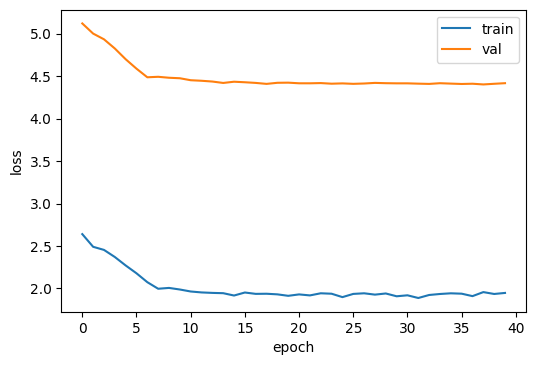

In [12]:
plot_loss_history(train_args)

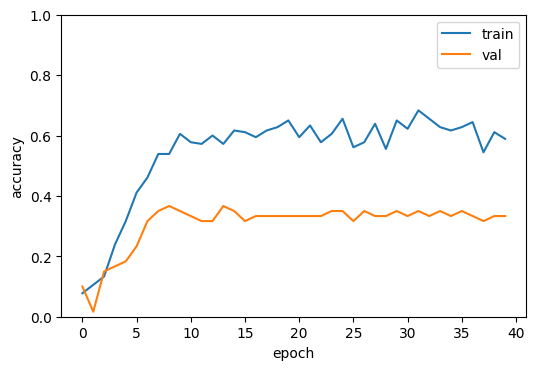

In [13]:
plot_acc_history(train_args)

In [14]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



val Loss: 4.4170 Acc: 0.3333

              precision    recall  f1-score   support

         0.0       0.25      0.40      0.31         5
         1.0       0.33      0.80      0.47         5
         2.0       0.00      0.00      0.00         5
         3.0       0.00      0.00      0.00         5
         4.0       0.50      0.40      0.44         5
         5.0       0.33      0.60      0.43         5
         6.0       0.00      0.00      0.00         5
         7.0       1.00      0.40      0.57         5
         8.0       0.23      0.60      0.33         5
         9.0       1.00      0.40      0.57         5
        10.0       0.67      0.40      0.50         5
        11.0       0.00      0.00      0.00         5

    accuracy                           0.33        60
   macro avg       0.36      0.33      0.30        60
weighted avg       0.36      0.33      0.30        60

Evaluation complete in 0m 9s


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Evaluation with only 1 clip

In [15]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=1,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 65229
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 19141
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 27333
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResiz


test Loss: 1.9357 Acc: 0.5667

              precision    recall  f1-score   support

         0.0       0.67      0.40      0.50         5
         1.0       0.44      0.80      0.57         5
         2.0       0.60      0.60      0.60         5
         3.0       0.57      0.80      0.67         5
         4.0       0.50      0.80      0.62         5
         5.0       0.33      0.20      0.25         5
         6.0       1.00      0.80      0.89         5
         7.0       0.80      0.80      0.80         5
         8.0       0.75      0.60      0.67         5
         9.0       0.33      0.20      0.25         5
        10.0       0.60      0.60      0.60         5
        11.0       0.25      0.20      0.22         5

    accuracy                           0.57        60
   macro avg       0.57      0.57      0.55        60
weighted avg       0.57      0.57      0.55        60

Evaluation complete in 0m 5s


### R(2+1)D with Adam

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=1,
                        eval_clips_per_video=2)

train_args = build_train_args(
  model_name='r2plus1d_18',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.r2plus1d_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'])

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 65229
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 19141
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 27333
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResiz


train Loss: 2.0332 Acc: 0.3222



val Loss: 11.5424 Acc: 0.2333

Epoch 1/39
----------



train Loss: 1.2880 Acc: 0.4833



val Loss: 3.8852 Acc: 0.3333

Epoch 2/39
----------



train Loss: 1.0521 Acc: 0.5889



val Loss: 2.0663 Acc: 0.6500

Epoch 3/39
----------



train Loss: 0.9264 Acc: 0.6000



val Loss: 2.1794 Acc: 0.6167

Epoch 4/39
----------



train Loss: 0.9849 Acc: 0.6000



val Loss: 1.9844 Acc: 0.6500

Epoch 5/39
----------



train Loss: 0.8250 Acc: 0.6833



val Loss: 5.2722 Acc: 0.2833

Epoch 6/39
----------



train Loss: 0.8568 Acc: 0.6500



val Loss: 4.5586 Acc: 0.2500

Epoch 7/39
----------



train Loss: 0.7011 Acc: 0.7556



val Loss: 1.6335 Acc: 0.7167

Epoch 8/39
----------



train Loss: 0.5793 Acc: 0.8056



val Loss: 1.4117 Acc: 0.7167

Epoch 9/39
----------



train Loss: 0.4935 Acc: 0.8556



val Loss: 1.2614 Acc: 0.7500

Epoch 10/39
----------



train Loss: 0.4269 Acc: 0.8611



val Loss: 1.2315 Acc: 0.7500

Epoch 11/39
----------



train Loss: 0.4499 Acc: 0.8667



val Loss: 1.0244 Acc: 0.7500

Epoch 12/39
----------



train Loss: 0.3677 Acc: 0.8778



val Loss: 1.0082 Acc: 0.7667

Epoch 13/39
----------



train Loss: 0.3401 Acc: 0.9111



val Loss: 0.9274 Acc: 0.8667

Epoch 14/39
----------



train Loss: 0.3606 Acc: 0.8778



val Loss: 0.8283 Acc: 0.8833

Epoch 15/39
----------



train Loss: 0.4204 Acc: 0.8722



val Loss: 0.8142 Acc: 0.9000

Epoch 16/39
----------



train Loss: 0.2805 Acc: 0.9167



val Loss: 0.8159 Acc: 0.8833

Epoch 17/39
----------



train Loss: 0.3900 Acc: 0.8944



val Loss: 0.7796 Acc: 0.8833

Epoch 18/39
----------



train Loss: 0.3902 Acc: 0.8944



val Loss: 0.7726 Acc: 0.9000

Epoch 19/39
----------



train Loss: 0.3682 Acc: 0.9111



val Loss: 0.7515 Acc: 0.9000

Epoch 20/39
----------



train Loss: 0.2945 Acc: 0.9222



val Loss: 0.7498 Acc: 0.9000

Epoch 21/39
----------



train Loss: 0.2645 Acc: 0.9167



val Loss: 0.7502 Acc: 0.9000

Epoch 22/39
----------



train Loss: 0.3264 Acc: 0.8944



val Loss: 0.7470 Acc: 0.9000

Epoch 23/39
----------



train Loss: 0.3579 Acc: 0.8611



val Loss: 0.7434 Acc: 0.9000

Epoch 24/39
----------



train Loss: 0.3709 Acc: 0.9222



val Loss: 0.7360 Acc: 0.9000

Epoch 25/39
----------



train Loss: 0.3301 Acc: 0.8722



val Loss: 0.7400 Acc: 0.9000

Epoch 26/39
----------



train Loss: 0.2872 Acc: 0.9111



val Loss: 0.7415 Acc: 0.9000

Epoch 27/39
----------



train Loss: 0.3405 Acc: 0.8889



val Loss: 0.7355 Acc: 0.9000

Epoch 28/39
----------



train Loss: 0.3377 Acc: 0.8722



val Loss: 0.7201 Acc: 0.9000

Epoch 29/39
----------



train Loss: 0.2862 Acc: 0.9111



val Loss: 0.7244 Acc: 0.9000

Epoch 30/39
----------



train Loss: 0.4199 Acc: 0.8722



val Loss: 0.7256 Acc: 0.9000

Epoch 31/39
----------



train Loss: 0.2820 Acc: 0.9222



val Loss: 0.7489 Acc: 0.9000

Epoch 32/39
----------



train Loss: 0.3301 Acc: 0.9056



val Loss: 0.7768 Acc: 0.9000

Epoch 33/39
----------



train Loss: 0.2654 Acc: 0.9389



val Loss: 0.7686 Acc: 0.9000

Epoch 34/39
----------



train Loss: 0.3071 Acc: 0.8944



val Loss: 0.7626 Acc: 0.9000

Epoch 35/39
----------



train Loss: 0.3339 Acc: 0.8889



val Loss: 0.7384 Acc: 0.9000

Epoch 36/39
----------



train Loss: 0.2932 Acc: 0.9167



val Loss: 0.7545 Acc: 0.9000

Epoch 37/39
----------



train Loss: 0.3410 Acc: 0.8889



val Loss: 0.7512 Acc: 0.9000

Epoch 38/39
----------



train Loss: 0.3063 Acc: 0.9167



val Loss: 0.7637 Acc: 0.9000

Epoch 39/39
----------



train Loss: 0.3079 Acc: 0.8889



val Loss: 0.7392 Acc: 0.9000

Training complete in 26m 43s



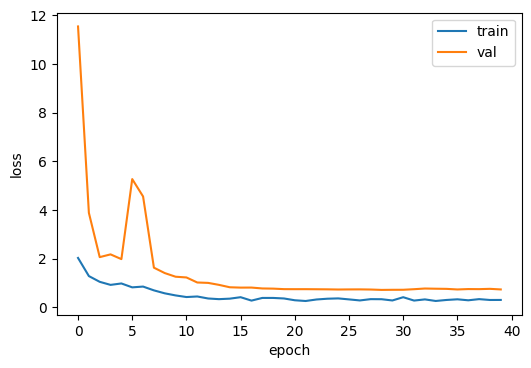

In [ ]:
plot_loss_history(train_args)

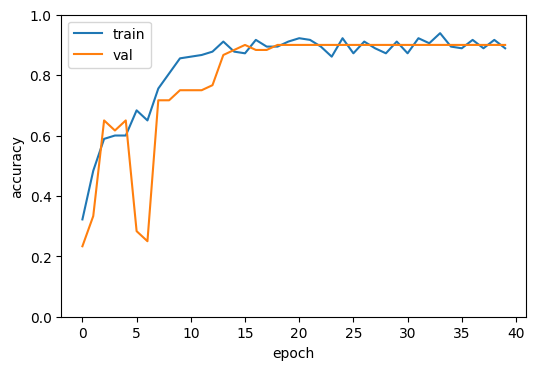

In [ ]:
plot_acc_history(train_args)

In [ ]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



test Loss: 0.5659 Acc: 0.9000

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         5
         1.0       0.75      0.60      0.67         5
         2.0       0.67      0.80      0.73         5
         3.0       1.00      1.00      1.00         5
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         5
         6.0       0.80      0.80      0.80         5
         7.0       0.80      0.80      0.80         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      0.80      0.89         5
        10.0       1.00      1.00      1.00         5
        11.0       0.83      1.00      0.91         5

    accuracy                           0.90        60
   macro avg       0.90      0.90      0.90        60
weighted avg       0.90      0.90      0.90        60

Evaluation complete in 0m 10s


#### Evaluation with only 1 clip

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=1,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 65229
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 19141
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 27333
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResiz


test Loss: 0.3573 Acc: 0.8667

              precision    recall  f1-score   support

         0.0       0.83      1.00      0.91         5
         1.0       0.60      0.60      0.60         5
         2.0       0.60      0.60      0.60         5
         3.0       1.00      0.80      0.89         5
         4.0       1.00      0.80      0.89         5
         5.0       0.83      1.00      0.91         5
         6.0       0.80      0.80      0.80         5
         7.0       0.80      0.80      0.80         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      1.00      1.00         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.87        60
   macro avg       0.87      0.87      0.87        60
weighted avg       0.87      0.87      0.87        60

Evaluation complete in 0m 5s


### R(2+1)D Adam, Temporal Stride 2

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,)

train_args = build_train_args(
  model_name='r2plus1d_18_stride2',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.r2plus1d_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'])

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


train Loss: 1.9108 Acc: 0.2889



val Loss: 8.3180 Acc: 0.1000

Epoch 1/39
----------



train Loss: 1.2433 Acc: 0.5778



val Loss: 11.2878 Acc: 0.1833

Epoch 2/39
----------



train Loss: 1.0539 Acc: 0.5778



val Loss: 7.7062 Acc: 0.4000

Epoch 3/39
----------



train Loss: 0.8785 Acc: 0.6333



val Loss: 5.2706 Acc: 0.2500

Epoch 4/39
----------



train Loss: 0.9410 Acc: 0.6889



val Loss: 4.9941 Acc: 0.3333

Epoch 5/39
----------



train Loss: 0.8250 Acc: 0.7111



val Loss: 3.5403 Acc: 0.4500

Epoch 6/39
----------



train Loss: 0.7771 Acc: 0.7000



val Loss: 4.7931 Acc: 0.3167

Epoch 7/39
----------



train Loss: 0.6182 Acc: 0.7667



val Loss: 2.3064 Acc: 0.5667

Epoch 8/39
----------



train Loss: 0.5348 Acc: 0.8389



val Loss: 1.5106 Acc: 0.6667

Epoch 9/39
----------



train Loss: 0.4526 Acc: 0.8722



val Loss: 1.3382 Acc: 0.7000

Epoch 10/39
----------



train Loss: 0.3187 Acc: 0.9167



val Loss: 1.2433 Acc: 0.7333

Epoch 11/39
----------



train Loss: 0.3326 Acc: 0.8833



val Loss: 1.2429 Acc: 0.6833

Epoch 12/39
----------



train Loss: 0.2884 Acc: 0.9222



val Loss: 1.2641 Acc: 0.6833

Epoch 13/39
----------



train Loss: 0.3494 Acc: 0.8556



val Loss: 1.1535 Acc: 0.7667

Epoch 14/39
----------



train Loss: 0.2626 Acc: 0.9333



val Loss: 1.1016 Acc: 0.7833

Epoch 15/39
----------



train Loss: 0.2925 Acc: 0.8889



val Loss: 1.0996 Acc: 0.7833

Epoch 16/39
----------



train Loss: 0.2540 Acc: 0.9167



val Loss: 1.0278 Acc: 0.8000

Epoch 17/39
----------



train Loss: 0.2495 Acc: 0.9278



val Loss: 1.0258 Acc: 0.8000

Epoch 18/39
----------



train Loss: 0.2727 Acc: 0.9111



val Loss: 1.0412 Acc: 0.8000

Epoch 19/39
----------



train Loss: 0.2646 Acc: 0.9278



val Loss: 1.0296 Acc: 0.8000

Epoch 20/39
----------



train Loss: 0.2398 Acc: 0.9500



val Loss: 1.0218 Acc: 0.8000

Epoch 21/39
----------



train Loss: 0.2219 Acc: 0.9389



val Loss: 1.0014 Acc: 0.8000

Epoch 22/39
----------



train Loss: 0.2816 Acc: 0.9056



val Loss: 1.0035 Acc: 0.8000

Epoch 23/39
----------



train Loss: 0.2029 Acc: 0.9556



val Loss: 1.0361 Acc: 0.8000

Epoch 24/39
----------



train Loss: 0.2240 Acc: 0.9333



val Loss: 1.0224 Acc: 0.8000

Epoch 25/39
----------



train Loss: 0.2323 Acc: 0.9444



val Loss: 1.0356 Acc: 0.7833

Epoch 26/39
----------



train Loss: 0.2294 Acc: 0.9389



val Loss: 1.0151 Acc: 0.8000

Epoch 27/39
----------



train Loss: 0.2133 Acc: 0.9556



val Loss: 1.0307 Acc: 0.7833

Epoch 28/39
----------



train Loss: 0.2773 Acc: 0.9000



val Loss: 1.0456 Acc: 0.8000

Epoch 29/39
----------



train Loss: 0.2598 Acc: 0.9056



val Loss: 1.0210 Acc: 0.8000

Epoch 30/39
----------



train Loss: 0.2447 Acc: 0.9278



val Loss: 0.9961 Acc: 0.8167

Epoch 31/39
----------



train Loss: 0.2627 Acc: 0.9167



val Loss: 1.0102 Acc: 0.8000

Epoch 32/39
----------



train Loss: 0.2504 Acc: 0.9389



val Loss: 1.0181 Acc: 0.8000

Epoch 33/39
----------



train Loss: 0.2225 Acc: 0.9333



val Loss: 1.0441 Acc: 0.8000

Epoch 34/39
----------



train Loss: 0.2369 Acc: 0.9056



val Loss: 1.0310 Acc: 0.8000

Epoch 35/39
----------



train Loss: 0.2164 Acc: 0.9278



val Loss: 1.0079 Acc: 0.8333

Epoch 36/39
----------



train Loss: 0.2953 Acc: 0.9000



val Loss: 1.0284 Acc: 0.8000

Epoch 37/39
----------



train Loss: 0.2710 Acc: 0.9389



val Loss: 1.0296 Acc: 0.7833

Epoch 38/39
----------



train Loss: 0.2212 Acc: 0.9333



val Loss: 1.0240 Acc: 0.8000

Epoch 39/39
----------



train Loss: 0.2428 Acc: 0.9389



val Loss: 0.9953 Acc: 0.8000

Training complete in 28m 18s



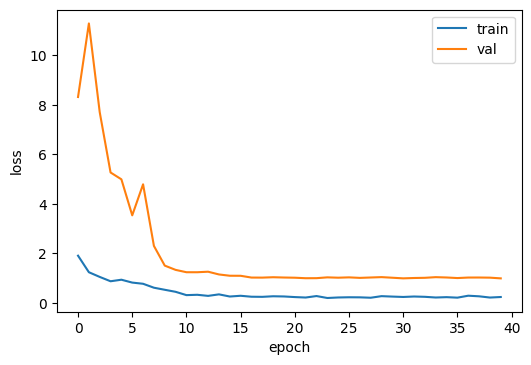

In [ ]:
plot_loss_history(train_args)

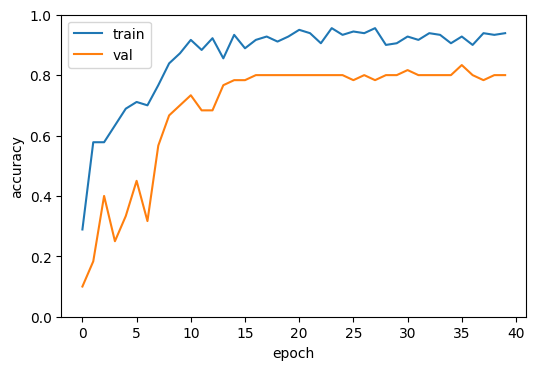

In [ ]:
plot_acc_history(train_args)

In [ ]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



test Loss: 0.5157 Acc: 0.9167

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         5
         1.0       1.00      0.60      0.75         5
         2.0       0.71      1.00      0.83         5
         3.0       1.00      1.00      1.00         5
         4.0       0.83      1.00      0.91         5
         5.0       1.00      0.80      0.89         5
         6.0       0.71      1.00      0.83         5
         7.0       1.00      0.60      0.75         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      1.00      1.00         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.92        60
   macro avg       0.94      0.92      0.91        60
weighted avg       0.94      0.92      0.91        60

Evaluation complete in 0m 11s


#### Evaluation using only 1 clip

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


test Loss: 0.2946 Acc: 0.8833

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         5
         1.0       1.00      0.60      0.75         5
         2.0       0.71      1.00      0.83         5
         3.0       1.00      1.00      1.00         5
         4.0       0.71      1.00      0.83         5
         5.0       1.00      0.60      0.75         5
         6.0       0.71      1.00      0.83         5
         7.0       1.00      0.60      0.75         5
         8.0       0.83      1.00      0.91         5
         9.0       1.00      0.80      0.89         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.88        60
   macro avg       0.91      0.88      0.88        60
weighted avg       0.91      0.88      0.88        60

Evaluation complete in 0m 6s


### R3D with Adam

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=1,
                        eval_clips_per_video=2)

train_args = build_train_args(
  model_name='r3d_18',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.r3d_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'])

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 65229
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 19141
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 27333
    Frames per clip: 16
    Temporal stride: 1
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResiz

Downloading: "https://download.pytorch.org/models/r3d_18-b3b3357e.pth" to /root/.cache/torch/checkpoints/r3d_18-b3b3357e.pth



/gdrive/My Drive/HandWashCheckpoints/r2plus1d_18
Epoch 0/39
----------



train Loss: 1.9323 Acc: 0.3000



val Loss: 14.6964 Acc: 0.0833

Epoch 1/39
----------



train Loss: 1.4217 Acc: 0.4389



val Loss: 6.0112 Acc: 0.2333

Epoch 2/39
----------



train Loss: 1.0021 Acc: 0.6000



val Loss: 2.4973 Acc: 0.4833

Epoch 3/39
----------



train Loss: 0.8016 Acc: 0.6778



val Loss: 2.3330 Acc: 0.6000

Epoch 4/39
----------



train Loss: 0.7670 Acc: 0.7111



val Loss: 1.6870 Acc: 0.6333

Epoch 5/39
----------



train Loss: 0.5987 Acc: 0.8000



val Loss: 2.4987 Acc: 0.6167

Epoch 6/39
----------



train Loss: 0.5997 Acc: 0.7778



val Loss: 1.8512 Acc: 0.5667

Epoch 7/39
----------



train Loss: 0.4817 Acc: 0.8444



val Loss: 1.2771 Acc: 0.7333

Epoch 8/39
----------



train Loss: 0.3371 Acc: 0.9000



val Loss: 1.0302 Acc: 0.8833

Epoch 9/39
----------



train Loss: 0.2776 Acc: 0.9278



val Loss: 0.8913 Acc: 0.8667

Epoch 10/39
----------



train Loss: 0.2610 Acc: 0.9278



val Loss: 0.8271 Acc: 0.9000

Epoch 11/39
----------



train Loss: 0.2719 Acc: 0.9167



val Loss: 0.8052 Acc: 0.8833

Epoch 12/39
----------



train Loss: 0.2573 Acc: 0.9278



val Loss: 0.7775 Acc: 0.8833

Epoch 13/39
----------



train Loss: 0.2859 Acc: 0.8944



val Loss: 0.7366 Acc: 0.8833

Epoch 14/39
----------



train Loss: 0.3034 Acc: 0.9111



val Loss: 0.7358 Acc: 0.9000

Epoch 15/39
----------



train Loss: 0.2240 Acc: 0.9222



val Loss: 0.7459 Acc: 0.8833

Epoch 16/39
----------



train Loss: 0.1969 Acc: 0.9611



val Loss: 0.7334 Acc: 0.8667

Epoch 17/39
----------



train Loss: 0.2015 Acc: 0.9500



val Loss: 0.7395 Acc: 0.8833

Epoch 18/39
----------



train Loss: 0.2176 Acc: 0.9278



val Loss: 0.7247 Acc: 0.8667

Epoch 19/39
----------



train Loss: 0.2457 Acc: 0.9278



val Loss: 0.7190 Acc: 0.8833

Epoch 20/39
----------



train Loss: 0.2000 Acc: 0.9500



val Loss: 0.7191 Acc: 0.8833

Epoch 21/39
----------



train Loss: 0.1714 Acc: 0.9611



val Loss: 0.7177 Acc: 0.8667

Epoch 22/39
----------



train Loss: 0.2359 Acc: 0.9278



val Loss: 0.7162 Acc: 0.8833

Epoch 23/39
----------



train Loss: 0.1763 Acc: 0.9556



val Loss: 0.7227 Acc: 0.8833

Epoch 24/39
----------



train Loss: 0.1818 Acc: 0.9500



val Loss: 0.7316 Acc: 0.8833

Epoch 25/39
----------



train Loss: 0.2001 Acc: 0.9500



val Loss: 0.7304 Acc: 0.8833

Epoch 26/39
----------



train Loss: 0.2097 Acc: 0.9389



val Loss: 0.7343 Acc: 0.8667

Epoch 27/39
----------



train Loss: 0.1711 Acc: 0.9500



val Loss: 0.7340 Acc: 0.8667

Epoch 28/39
----------



train Loss: 0.2115 Acc: 0.9278



val Loss: 0.7153 Acc: 0.8667

Epoch 29/39
----------



train Loss: 0.1800 Acc: 0.9556



val Loss: 0.7128 Acc: 0.8667

Epoch 30/39
----------



train Loss: 0.2469 Acc: 0.9000



val Loss: 0.7262 Acc: 0.8667

Epoch 31/39
----------



train Loss: 0.1779 Acc: 0.9611



val Loss: 0.7299 Acc: 0.8667

Epoch 32/39
----------



train Loss: 0.2280 Acc: 0.9278



val Loss: 0.7141 Acc: 0.8667

Epoch 33/39
----------



train Loss: 0.2029 Acc: 0.9500



val Loss: 0.7162 Acc: 0.8833

Epoch 34/39
----------



train Loss: 0.1892 Acc: 0.9611



val Loss: 0.7235 Acc: 0.8833

Epoch 35/39
----------



train Loss: 0.1712 Acc: 0.9444



val Loss: 0.7268 Acc: 0.8833

Epoch 36/39
----------



train Loss: 0.2298 Acc: 0.9333



val Loss: 0.7187 Acc: 0.8667

Epoch 37/39
----------



train Loss: 0.2099 Acc: 0.9556



val Loss: 0.7089 Acc: 0.8667

Epoch 38/39
----------



train Loss: 0.2628 Acc: 0.9222



val Loss: 0.6775 Acc: 0.8667

Epoch 39/39
----------



train Loss: 0.1873 Acc: 0.9444



val Loss: 0.7120 Acc: 0.8667

Training complete in 22m 17s



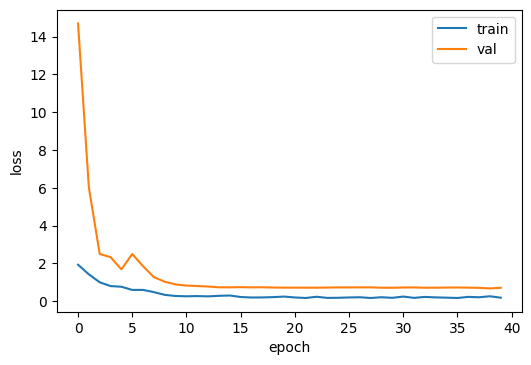

In [ ]:
plot_loss_history(train_args)

Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7f6adca4b1d0>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 962, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 942, in _shutdown_workers
    w.join()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 124, in join
    res = self._popen.wait(timeout)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 50, in wait
    return self.poll(os.WNOHANG if timeout == 0.0 else 0)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 28, in poll
    pid, sts = os.waitpid(self.pid, flag)
KeyboardInterrupt: 


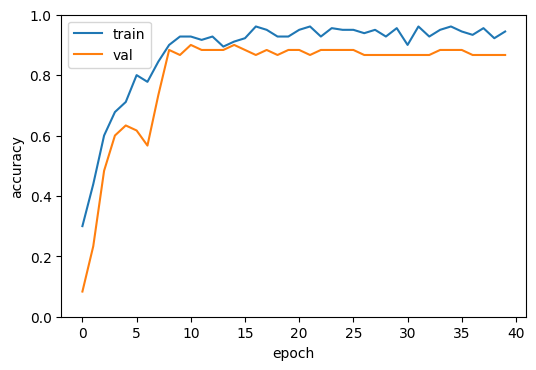

In [ ]:
plot_acc_history(train_args)

In [ ]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



test Loss: 0.3226 Acc: 0.9333

              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89         5
         1.0       0.75      0.60      0.67         5
         2.0       0.67      0.80      0.73         5
         3.0       0.83      1.00      0.91         5
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         5
         6.0       1.00      1.00      1.00         5
         7.0       1.00      1.00      1.00         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      1.00      1.00         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.93        60
   macro avg       0.94      0.93      0.93        60
weighted avg       0.94      0.93      0.93        60

Evaluation complete in 0m 8s


#### Evaluation using only 1 clip

In [ ]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


test Loss: 0.3875 Acc: 0.8833

              precision    recall  f1-score   support

         0.0       1.00      0.60      0.75         5
         1.0       0.71      1.00      0.83         5
         2.0       1.00      0.60      0.75         5
         3.0       0.71      1.00      0.83         5
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         5
         6.0       0.83      1.00      0.91         5
         7.0       1.00      0.80      0.89         5
         8.0       0.83      1.00      0.91         5
         9.0       1.00      0.80      0.89         5
        10.0       0.83      1.00      0.91         5
        11.0       1.00      0.80      0.89         5

    accuracy                           0.88        60
   macro avg       0.91      0.88      0.88        60
weighted avg       0.91      0.88      0.88        60

Evaluation complete in 0m 5s


### R3D with Adam, Temporal Stride 2

In [17]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=2)

train_args = build_train_args(
  model_name='r3d_18_stride2',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.r3d_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'])

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


train Loss: 1.9084 Acc: 0.3889



val Loss: 26.6743 Acc: 0.1333

Epoch 1/39
----------



train Loss: 1.0390 Acc: 0.5833



val Loss: 3.3140 Acc: 0.3167

Epoch 2/39
----------



train Loss: 0.6972 Acc: 0.7167



val Loss: 2.9829 Acc: 0.5500

Epoch 3/39
----------



train Loss: 0.6951 Acc: 0.7500



val Loss: 3.7154 Acc: 0.3500

Epoch 4/39
----------



train Loss: 0.7022 Acc: 0.7667



val Loss: 2.5442 Acc: 0.4500

Epoch 5/39
----------



train Loss: 0.4636 Acc: 0.8389



val Loss: 3.1069 Acc: 0.4000

Epoch 6/39
----------



train Loss: 0.4452 Acc: 0.8389



val Loss: 1.8223 Acc: 0.6833

Epoch 7/39
----------



train Loss: 0.4661 Acc: 0.8556



val Loss: 1.3526 Acc: 0.7500

Epoch 8/39
----------



train Loss: 0.2486 Acc: 0.9167



val Loss: 1.1812 Acc: 0.7667

Epoch 9/39
----------



train Loss: 0.2214 Acc: 0.9333



val Loss: 1.0041 Acc: 0.8000

Epoch 10/39
----------



train Loss: 0.1988 Acc: 0.9444



val Loss: 0.9165 Acc: 0.8500

Epoch 11/39
----------



train Loss: 0.1791 Acc: 0.9444



val Loss: 0.9068 Acc: 0.8667

Epoch 12/39
----------



train Loss: 0.1850 Acc: 0.9667



val Loss: 0.9351 Acc: 0.8333

Epoch 13/39
----------



train Loss: 0.1626 Acc: 0.9556



val Loss: 0.9285 Acc: 0.8333

Epoch 14/39
----------



train Loss: 0.1639 Acc: 0.9722



val Loss: 0.9220 Acc: 0.8333

Epoch 15/39
----------



train Loss: 0.1396 Acc: 0.9611



val Loss: 0.8871 Acc: 0.8500

Epoch 16/39
----------



train Loss: 0.1551 Acc: 0.9556



val Loss: 0.8761 Acc: 0.8500

Epoch 17/39
----------



train Loss: 0.1576 Acc: 0.9556



val Loss: 0.8514 Acc: 0.8500

Epoch 18/39
----------



train Loss: 0.1077 Acc: 0.9889



val Loss: 0.8449 Acc: 0.8500

Epoch 19/39
----------



train Loss: 0.1485 Acc: 0.9611



val Loss: 0.8469 Acc: 0.8500

Epoch 20/39
----------



train Loss: 0.1403 Acc: 0.9611



val Loss: 0.8267 Acc: 0.8333

Epoch 21/39
----------



train Loss: 0.1189 Acc: 0.9778



val Loss: 0.8313 Acc: 0.8667

Epoch 22/39
----------



train Loss: 0.1253 Acc: 0.9778



val Loss: 0.8390 Acc: 0.8333

Epoch 23/39
----------



train Loss: 0.1166 Acc: 0.9833



val Loss: 0.8503 Acc: 0.8333

Epoch 24/39
----------



train Loss: 0.1403 Acc: 0.9611



val Loss: 0.8352 Acc: 0.8333

Epoch 25/39
----------



train Loss: 0.1471 Acc: 0.9556



val Loss: 0.8458 Acc: 0.8333

Epoch 26/39
----------



train Loss: 0.1555 Acc: 0.9667



val Loss: 0.8287 Acc: 0.8333

Epoch 27/39
----------



train Loss: 0.1532 Acc: 0.9444



val Loss: 0.8483 Acc: 0.8333

Epoch 28/39
----------



train Loss: 0.1129 Acc: 0.9667



val Loss: 0.8369 Acc: 0.8500

Epoch 29/39
----------



train Loss: 0.1369 Acc: 0.9667



val Loss: 0.8538 Acc: 0.8333

Epoch 30/39
----------



train Loss: 0.1187 Acc: 0.9833



val Loss: 0.8319 Acc: 0.8333

Epoch 31/39
----------



train Loss: 0.1756 Acc: 0.9556



val Loss: 0.8272 Acc: 0.8333

Epoch 32/39
----------



train Loss: 0.0996 Acc: 0.9833



val Loss: 0.8343 Acc: 0.8333

Epoch 33/39
----------



train Loss: 0.1255 Acc: 0.9833



val Loss: 0.8326 Acc: 0.8500

Epoch 34/39
----------



train Loss: 0.1388 Acc: 0.9667



val Loss: 0.8512 Acc: 0.8000

Epoch 35/39
----------



train Loss: 0.1765 Acc: 0.9611



val Loss: 0.8447 Acc: 0.8500

Epoch 36/39
----------



train Loss: 0.1485 Acc: 0.9556



val Loss: 0.8535 Acc: 0.8500

Epoch 37/39
----------



train Loss: 0.1474 Acc: 0.9500



val Loss: 0.8326 Acc: 0.8500

Epoch 38/39
----------



train Loss: 0.1048 Acc: 0.9944



val Loss: 0.8581 Acc: 0.8000

Epoch 39/39
----------



train Loss: 0.0850 Acc: 0.9833



val Loss: 0.8437 Acc: 0.8333

Training complete in 23m 32s



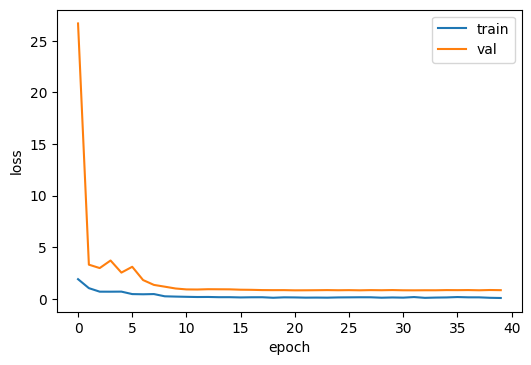

In [18]:
plot_loss_history(train_args)

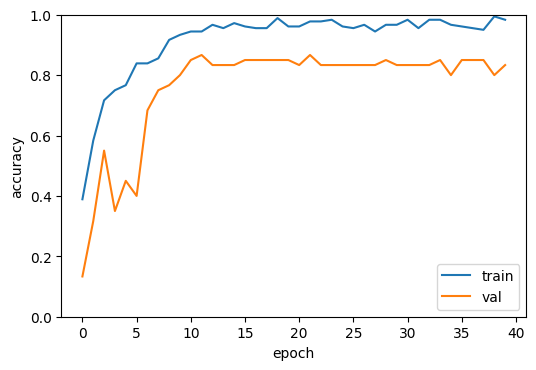

In [19]:
plot_acc_history(train_args)

In [20]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



test Loss: 0.3489 Acc: 0.9167

              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89         5
         1.0       0.75      0.60      0.67         5
         2.0       0.67      0.80      0.73         5
         3.0       0.83      1.00      0.91         5
         4.0       0.83      1.00      0.91         5
         5.0       1.00      0.80      0.89         5
         6.0       1.00      1.00      1.00         5
         7.0       1.00      1.00      1.00         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      1.00      1.00         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.92        60
   macro avg       0.92      0.92      0.92        60
weighted avg       0.92      0.92      0.92        60

Evaluation complete in 0m 9s


In [21]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


test Loss: 0.1975 Acc: 0.9167

              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89         5
         1.0       0.75      0.60      0.67         5
         2.0       0.67      0.80      0.73         5
         3.0       0.83      1.00      0.91         5
         4.0       0.83      1.00      0.91         5
         5.0       1.00      0.80      0.89         5
         6.0       1.00      1.00      1.00         5
         7.0       1.00      1.00      1.00         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      1.00      1.00         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.92        60
   macro avg       0.92      0.92      0.92        60
weighted avg       0.92      0.92      0.92        60

Evaluation complete in 0m 5s


### MC3 with Adam, Temporal Stride 2

In [24]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=2)

train_args = build_train_args(
  model_name='mc3_18_stride2',
  override_checkpoints=True,
  batch_size=30,
  gradient_accumulation_steps=2,
  lr=1e-3
)

dataloaders = get_dataloaders(train_args, datasets)
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = torchvision.models.video.mc3_18(pretrained=True)
num_ftrs = model.fc.in_features
# Change the last layer of the model. Yes, you can do that with Pytorch.
model.fc = nn.Linear(num_ftrs, len(datasets['train'].classes))

model = model.to(device)
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                          lr=train_args['lr'])

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(train_args, model, criterion, optimizer, 
                       exp_lr_scheduler,
                       num_epochs=40, resume=False)

_ = print() 

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


train Loss: 2.0200 Acc: 0.3222



val Loss: 34.6593 Acc: 0.1667

Epoch 1/39
----------



train Loss: 0.9919 Acc: 0.6556



val Loss: 4.4130 Acc: 0.3333

Epoch 2/39
----------



train Loss: 0.8550 Acc: 0.6833



val Loss: 3.6417 Acc: 0.3833

Epoch 3/39
----------



train Loss: 0.5236 Acc: 0.8167



val Loss: 3.4411 Acc: 0.4000

Epoch 4/39
----------



train Loss: 0.3946 Acc: 0.8667



val Loss: 1.9271 Acc: 0.6333

Epoch 5/39
----------



train Loss: 0.3905 Acc: 0.8556



val Loss: 2.0936 Acc: 0.6667

Epoch 6/39
----------



train Loss: 0.4504 Acc: 0.8333



val Loss: 1.6529 Acc: 0.6833

Epoch 7/39
----------



train Loss: 0.3663 Acc: 0.8667



val Loss: 1.2409 Acc: 0.7167

Epoch 8/39
----------



train Loss: 0.3112 Acc: 0.9167



val Loss: 0.9837 Acc: 0.8000

Epoch 9/39
----------



train Loss: 0.1794 Acc: 0.9611



val Loss: 0.8873 Acc: 0.8333

Epoch 10/39
----------



train Loss: 0.2216 Acc: 0.9500



val Loss: 0.8804 Acc: 0.8333

Epoch 11/39
----------



train Loss: 0.1347 Acc: 0.9722



val Loss: 0.8364 Acc: 0.8000

Epoch 12/39
----------



train Loss: 0.1377 Acc: 0.9833



val Loss: 0.7914 Acc: 0.8500

Epoch 13/39
----------



train Loss: 0.1426 Acc: 0.9778



val Loss: 0.8306 Acc: 0.8500

Epoch 14/39
----------



train Loss: 0.1291 Acc: 0.9611



val Loss: 0.8322 Acc: 0.8667

Epoch 15/39
----------



train Loss: 0.1400 Acc: 0.9667



val Loss: 0.7785 Acc: 0.8500

Epoch 16/39
----------



train Loss: 0.1080 Acc: 0.9722



val Loss: 0.7684 Acc: 0.8500

Epoch 17/39
----------



train Loss: 0.1296 Acc: 0.9611



val Loss: 0.7579 Acc: 0.8667

Epoch 18/39
----------



train Loss: 0.1053 Acc: 0.9778



val Loss: 0.7340 Acc: 0.8667

Epoch 19/39
----------



train Loss: 0.1057 Acc: 0.9778



val Loss: 0.7357 Acc: 0.8667

Epoch 20/39
----------



train Loss: 0.1207 Acc: 0.9778



val Loss: 0.7089 Acc: 0.8500

Epoch 21/39
----------



train Loss: 0.1224 Acc: 0.9722



val Loss: 0.6925 Acc: 0.8667

Epoch 22/39
----------



train Loss: 0.1398 Acc: 0.9611



val Loss: 0.6937 Acc: 0.8500

Epoch 23/39
----------



train Loss: 0.1219 Acc: 0.9778



val Loss: 0.6850 Acc: 0.8667

Epoch 24/39
----------



train Loss: 0.1279 Acc: 0.9667



val Loss: 0.7087 Acc: 0.8833

Epoch 25/39
----------



train Loss: 0.1122 Acc: 0.9667



val Loss: 0.7073 Acc: 0.8500

Epoch 26/39
----------



train Loss: 0.1468 Acc: 0.9389



val Loss: 0.7024 Acc: 0.8833

Epoch 27/39
----------



train Loss: 0.1533 Acc: 0.9556



val Loss: 0.6956 Acc: 0.8833

Epoch 28/39
----------



train Loss: 0.1315 Acc: 0.9667



val Loss: 0.6861 Acc: 0.8667

Epoch 29/39
----------



train Loss: 0.1052 Acc: 0.9889



val Loss: 0.7197 Acc: 0.8833

Epoch 30/39
----------



train Loss: 0.0986 Acc: 0.9833



val Loss: 0.7114 Acc: 0.8500

Epoch 31/39
----------



train Loss: 0.1060 Acc: 0.9778



val Loss: 0.7105 Acc: 0.8500

Epoch 32/39
----------



train Loss: 0.0942 Acc: 0.9833



val Loss: 0.6944 Acc: 0.8667

Epoch 33/39
----------



train Loss: 0.1233 Acc: 0.9722



val Loss: 0.7189 Acc: 0.8667

Epoch 34/39
----------



train Loss: 0.0995 Acc: 0.9889



val Loss: 0.7126 Acc: 0.8833

Epoch 35/39
----------



train Loss: 0.0989 Acc: 0.9944



val Loss: 0.7024 Acc: 0.8667

Epoch 36/39
----------



train Loss: 0.0792 Acc: 0.9944



val Loss: 0.7077 Acc: 0.8500

Epoch 37/39
----------



train Loss: 0.1105 Acc: 0.9722



val Loss: 0.7308 Acc: 0.8500

Epoch 38/39
----------



train Loss: 0.0986 Acc: 0.9889



val Loss: 0.7333 Acc: 0.8667

Epoch 39/39
----------



train Loss: 0.1207 Acc: 0.9722



val Loss: 0.7137 Acc: 0.8500

Training complete in 24m 47s



In [25]:
_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

----------



test Loss: 0.3302 Acc: 0.9500

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         5
         1.0       0.80      0.80      0.80         5
         2.0       0.80      0.80      0.80         5
         3.0       1.00      1.00      1.00         5
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         5
         6.0       0.83      1.00      0.91         5
         7.0       1.00      1.00      1.00         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      0.80      0.89         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.95        60
   macro avg       0.95      0.95      0.95        60
weighted avg       0.95      0.95      0.95        60

Evaluation complete in 0m 9s


In [26]:
datasets = get_datasets(use_resized=True, use_precomputed_metadata=True,
                        transform=True,
                        pretrain='kinetics400',
                        temporal_stride=2,
                        eval_clips_per_video=1)
dataloaders = get_dataloaders(train_args, datasets)

_ = evaluate_model(train_args, model, criterion, 'test', print_classification_report=True)

kinetics400
Dataset HandWashDataset - split train
    Number of videos: 180
    Number of clips: 31228
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    RandomCrop(size=(112, 112))
    RandomHorizontalFlip(p=0.5)
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split val
    Number of videos: 60
    Number of clips: 9108
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResized128x171
    Compose(
    ToFloatTensorInZeroOne()
    CenterCrop(size=(112, 112))
    Normalize(mean=[0.43216, 0.394666, 0.37645], std=[0.22803, 0.22145, 0.216989])
)

Dataset HandWashDataset - split test
    Number of videos: 60
    Number of clips: 13199
    Frames per clip: 16
    Temporal stride: 2
    Root location: /gdrive/My Drive/HandWashCheckpoints/HandWashResize


test Loss: 0.1767 Acc: 0.9500

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         5
         1.0       0.80      0.80      0.80         5
         2.0       0.80      0.80      0.80         5
         3.0       1.00      1.00      1.00         5
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         5
         6.0       1.00      1.00      1.00         5
         7.0       0.83      1.00      0.91         5
         8.0       1.00      1.00      1.00         5
         9.0       1.00      0.80      0.89         5
        10.0       1.00      1.00      1.00         5
        11.0       1.00      1.00      1.00         5

    accuracy                           0.95        60
   macro avg       0.95      0.95      0.95        60
weighted avg       0.95      0.95      0.95        60

Evaluation complete in 0m 5s


# Results

Massive improvements are obtained when using Adam optimizer, this can be explained due to the high variability that our training has, in each epoch the frames of a video seen by the dataset may be different. For some models reducing the temporal resolution improves the performance. 

We note that, in general including post-processing of multiclip predictions improves the performance of the models.

The best performant model MC3 has the least amount of parameters, around a third of the other two models. This points us to lighter models as is a trend in recent research such as X3D or Temporal Shift Module.

There are more experiments that were done that are not included in this notebook, but the results are shown and analyzed in the technical report and poster. For more results analysis please see the report and poster.

# References

1. Hand Wash Dataset. https://www.kaggle.com/realtimear/hand-wash-dataset
1. Awesome repository for action recogniton https://github.com/jinwchoi/awesome-action-recognition
1. Action recognition 2018 review http://blog.qure.ai/notes/deep-learning-for-videos-action-recognition-review#sec-2
1. Feichtenhofer, C., Fan, H., Malik, J., & He, K. (2019). Slowfast networks for video recognition. Proceedings of the IEEE International Conference on Computer Vision, 2019-October,
1. Lin, J., Gan, C., & Han, S. (2019). TSM: Temporal shift module for efficient video understanding. Proceedings of the IEEE International Conference on Computer Vision, 2019-October, 7082–7092. https://doi.org/10.1109/ICCV.2019.00718


In [ ]:
@article{paszke2017automatic,
  title={Automatic differentiation in PyTorch},
  author={Paszke, Adam and Gross, Sam and Chintala, Soumith and Chanan, Gregory and Yang, Edward and DeVito, Zachary and Lin, Zeming and Desmaison, Alban and Antiga, Luca and Lerer, Adam},
  year={2017}
}

@misc{tran2017closer,
    title={A Closer Look at Spatiotemporal Convolutions for Action Recognition},
    author={Du Tran and Heng Wang and Lorenzo Torresani and Jamie Ray and Yann LeCun and Manohar Paluri},
    year={2017},
    eprint={1711.11248},
    archivePrefix={arXiv},
    primaryClass={cs.CV}
}



SyntaxError: ignored